<a href="https://colab.research.google.com/github/Siddharth1698/Insurance-Cross-Sell-Prediction/blob/main/MLProjectInsuranceCrossSellPrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning Project

## Health Insurance Cross Sell Prediction

#####                  Adwait Dathan R (CB.EN.P2AID20007)
#####                  Siddharth M (CB.EN.P2AID200037)

### Some Visuals run using Plotly have not been rendered in this document due to plotly to pdf converting issue. Do run in Colab to see full visualization. 

We have our client as an Insurance company that has provided Health Insurance to its customers now they need our help in building a model to predict whether the policyholders (customers) from past year will also be interested in Vehicle Insurance provided by the company.

An insurance policy is an arrangement by which a company undertakes to provide a guarantee of compensation for specified loss, damage, illness, or death in return for the payment of a specified premium. A premium is a sum of money that the customer needs to pay regularly to an insurance company for this guarantee.

For example, you may pay a premium of Rs. 5000 each year for a health insurance cover of Rs. 200,000/- so that if, God forbid, you fall ill and need to be hospitalised in that year, the insurance provider company will bear the cost of hospitalisation etc. for upto Rs. 200,000. Now if you are wondering how can company bear such high hospitalisation cost when it charges a premium of only Rs. 5000/-, that is where the concept of probabilities comes in picture. For example, like you, there may be 100 customers who would be paying a premium of Rs. 5000 every year, but only a few of them (say 2-3) would get hospitalised that year and not everyone. This way everyone shares the risk of everyone else.

Just like medical insurance, there is vehicle insurance where every year customer needs to pay a premium of certain amount to insurance provider company so that in case of unfortunate accident by the vehicle, the insurance provider company will provide a compensation (called ‘sum assured’) to the customer.

Building a model to predict whether a customer would be interested in Vehicle Insurance is extremely helpful for the company because it can then accordingly plan its communication strategy to reach out to those customers and optimise its business model and revenue.

Now, in order to predict, whether the customer would be interested in Vehicle insurance, you have information about demographics (gender, age, region code type), Vehicles (Vehicle Age, Damage), Policy (Premium, sourcing channel) etc.

# Importing all Libraries

We have imported the required libraries here.

In [2]:
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
# compare the number of repeats for repeated k-fold cross-validation
from scipy.stats import sem
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from matplotlib import pyplot
from sklearn import datasets
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from matplotlib.colors import ListedColormap
# Grid search cross validation
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
# Splitting the X and Y into the
# Training set and Testing set
# Fitting Logistic Regression To the training set
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import IncrementalPCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix

# Loading the dataset and wrangling

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/Siddharth1698/Insurance-Cross-Sell-Prediction/main/train.csv')
df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


In [4]:
df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [5]:
df.isnull().sum()

id                      0
Gender                  0
Age                     0
Driving_License         0
Region_Code             0
Previously_Insured      0
Vehicle_Age             0
Vehicle_Damage          0
Annual_Premium          0
Policy_Sales_Channel    0
Vintage                 0
Response                0
dtype: int64

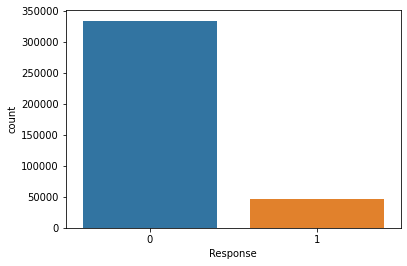

In [6]:
sns.countplot(df['Response'])

Here we have an imbalanced dataset and we are performing classification on the target variable Response.

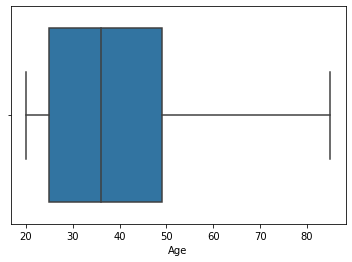

In [7]:
sns.boxplot(x=df['Age'])

# Encoding

In [8]:
df['Gender'] = df['Gender'].map( {'Female': 0, 'Male': 1} ).astype(int)
df['Vehicle_Damage'] = df['Vehicle_Damage'].map( {'Yes': 0, 'No': 1} ).astype(int)

We have encoded Gender and Vehicle damage as 0 and 1.

In [9]:
df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,1,44,1,28.0,0,> 2 Years,0,40454.0,26.0,217,1
1,2,1,76,1,3.0,0,1-2 Year,1,33536.0,26.0,183,0
2,3,1,47,1,28.0,0,> 2 Years,0,38294.0,26.0,27,1
3,4,1,21,1,11.0,1,< 1 Year,1,28619.0,152.0,203,0
4,5,0,29,1,41.0,1,< 1 Year,1,27496.0,152.0,39,0


In [10]:
Mean_encoded_subject = df.groupby(['Region_Code'])['Response'].mean().to_dict() 
df['Region_Code'] =  df['Region_Code'].map(Mean_encoded_subject) 

Mean_encoded_subject = df.groupby(['Policy_Sales_Channel'])['Response'].mean().to_dict() 
df['Policy_Sales_Channel'] =  df['Policy_Sales_Channel'].map(Mean_encoded_subject) 

df.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,1,44,1,0.187163,0,> 2 Years,0,40454.0,0.199385,217,1
1,2,1,76,1,0.127662,0,1-2 Year,1,33536.0,0.199385,183,0
2,3,1,47,1,0.187163,0,> 2 Years,0,38294.0,0.199385,27,1
3,4,1,21,1,0.112760,1,< 1 Year,1,28619.0,0.028624,203,0
4,5,0,29,1,0.121776,1,< 1 Year,1,27496.0,0.028624,39,0


Mean encoding is employed here as we have variables like Region code and policy channel which can actually help us with the weight that are contributing overall in that variable.

In [11]:
def encode(df, columns, prefixes):
    df = df.copy()
    for column, prefix in zip(columns, prefixes):
        dummies = pd.get_dummies(df[column], prefix=prefix)
        df = pd.concat([df, dummies], axis=1)
        df = df.drop(column, axis=1)
    return df

In [12]:
df = encode(
    df,
    columns=['Gender', 'Vehicle_Age', 'Vehicle_Damage'],
    prefixes=['G', 'VA', 'VD']
)
df.head()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response,G_0,G_1,VA_1-2 Year,VA_< 1 Year,VA_> 2 Years,VD_0,VD_1
0,1,44,1,0.187163,0,40454.0,0.199385,217,1,0,1,0,0,1,1,0
1,2,76,1,0.127662,0,33536.0,0.199385,183,0,0,1,1,0,0,0,1
2,3,47,1,0.187163,0,38294.0,0.199385,27,1,0,1,0,0,1,1,0
3,4,21,1,0.112760,1,28619.0,0.028624,203,0,0,1,0,1,0,0,1
4,5,29,1,0.121776,1,27496.0,0.028624,39,0,1,0,0,1,0,0,1


Gender, Vehicle age and Vehicle damage can be encoded using One hot encoding here.

In [13]:
df = df.drop("id",axis=1)
df.head()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response,G_0,G_1,VA_1-2 Year,VA_< 1 Year,VA_> 2 Years,VD_0,VD_1
0,44,1,0.187163,0,40454.0,0.199385,217,1,0,1,0,0,1,1,0
1,76,1,0.127662,0,33536.0,0.199385,183,0,0,1,1,0,0,0,1
2,47,1,0.187163,0,38294.0,0.199385,27,1,0,1,0,0,1,1,0
3,21,1,0.112760,1,28619.0,0.028624,203,0,0,1,0,1,0,0,1
4,29,1,0.121776,1,27496.0,0.028624,39,0,1,0,0,1,0,0,1


# Sampling the data

In [14]:
y = df['Response'].copy()
X = df.drop('Response', axis=1).copy()

In [15]:
from imblearn.under_sampling import NearMiss 
nr = NearMiss() 
  
X, y = nr.fit_sample(X, y.ravel())

As we saw earlier in our target variable Response we have a huge imbalance. So the best way to move forward is to either Undersample or Oversample the data. This way we can bring overall balance to both classes in dataset. 

Here, we are undersampling the data with NearMiss technique that can find boundries favoring the particular class and sample synthetic datapoints.

In [16]:
df.columns

Index(['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'Vintage', 'Response', 'G_0',
       'G_1', 'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1'],
      dtype='object')

In [17]:

   
# creating a list of column names 
column_values = ['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'Vintage',  'G_0',
       'G_1', 'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1'] 
  
# creating the dataframe 
df = pd.DataFrame(data = X,    
                  columns = column_values) 
df['Response'] = y

In [18]:
df.head()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,G_0,G_1,VA_1-2 Year,VA_< 1 Year,VA_> 2 Years,VD_0,VD_1,Response
0,42.0,1.0,0.079914,0.0,2630.0,0.189148,210.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0
1,40.0,1.0,0.096142,0.0,2630.0,0.189148,243.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0
2,42.0,1.0,0.073825,0.0,2630.0,0.199385,210.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0
3,43.0,1.0,0.086096,0.0,2630.0,0.199385,114.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0
4,47.0,1.0,0.090188,0.0,2630.0,0.189148,85.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0


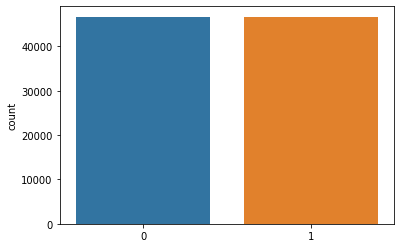

In [19]:
sns.countplot(y)

As we can see now we have a completely balanced dataset for classification. This can help us further in analyzing AUC scores.

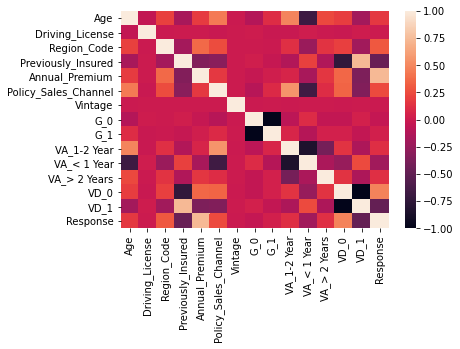

In [20]:
sns.heatmap(df.corr())

## Functions to classify

In [21]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
    
# Used for classification of dataset.
def classif_results(): 
  print(model)
  conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred)
  print('Confusion matrix:\n', conf_mat)

  labels = ['Class 0', 'Class 1']
  fig = plt.figure()
  ax = fig.add_subplot(111)
  cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
  fig.colorbar(cax)
  ax.set_xticklabels([''] + labels)
  ax.set_yticklabels([''] + labels)
  plt.xlabel('Predicted')
  plt.ylabel('Expected')
  plt.show()

  print("Accuracy", metrics.accuracy_score(y_test, y_pred))

  from sklearn.metrics import classification_report
  print(classification_report(y_test, y_pred))

  
  auc = roc_auc_score(y_test, y_pred)
  print("AUC Score: ")
  print(auc)

  fpr, tpr, thresholds = roc_curve(y_test, y_pred)
  plot_roc_curve(fpr, tpr)


def prcurve():
  precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
  fpr, tpr, _ = roc_curve(y_test, y_pred)
  auc_score = roc_auc_score(y_test, y_pred)

  fig = px.area(
      x=recall, y=precision,
      title=f'Precision-Recall Curve (AUC={auc(fpr, tpr):.4f})',
      labels=dict(x='Recall', y='Precision'),
      width=700, height=500
  )
  fig.add_shape(
      type='line', line=dict(dash='dash'),
      x0=0, x1=1, y0=1, y1=0
  )
  fig.update_yaxes(scaleanchor="x", scaleratio=1)
  fig.update_xaxes(constrain='domain')
  fig.show()



# Classification and Ensemble Techniques

## Logistic Regression

### Logistic regression for one variable

We want to visualize how we can see Age against our Response and see the logistic regression over it.

In [42]:
Xi = df[['Age']].values.reshape(-1,1)
yi = (df["Response"] == 1).astype(np.int)


from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
Xi = sc_X.fit_transform(Xi)


In [43]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(solver="lbfgs", random_state=42)
log_reg.fit(Xi, yi)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

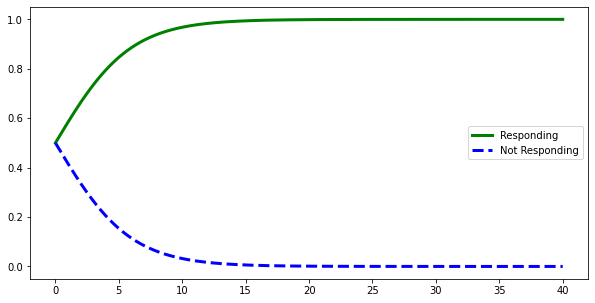

In [44]:
plt.figure(figsize=(10,5))

X_new = np.linspace(0, 40 , 5000).reshape(-1, 1)
y_proba = log_reg.predict_proba(X_new)

plt.plot(X_new, y_proba[:, 1], "g-", linewidth=3, label="Responding")
plt.plot(X_new, y_proba[:, 0], "b--", linewidth=3, label="Not Responding")
plt.legend()

Here we can visualize the logistic regression model for Responding and Not Responding.

### Logistic Regression without regularization

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Confusion matrix:
 [[14013     0]
 [ 2522 11491]]


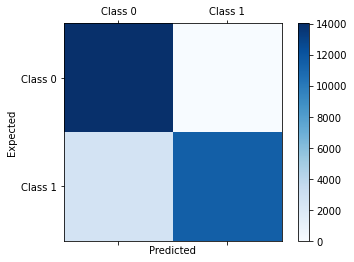

Accuracy 0.910012131592093
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.910012131592093


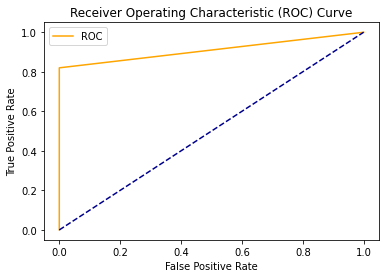

Accuracy of logistic regression classifier on test set: 0.91


In [49]:
X = df.drop('Response',axis=1)
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=42)



model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

We can perform cross validation to see how our model performs across different sets of data selection and we plot a box plot to see the comparison and from that we can also infer the standard error occured.

>1 mean=0.9100 se=0.002
>2 mean=0.9100 se=0.001
>3 mean=0.9100 se=0.001
>4 mean=0.9100 se=0.001
>5 mean=0.9100 se=0.001


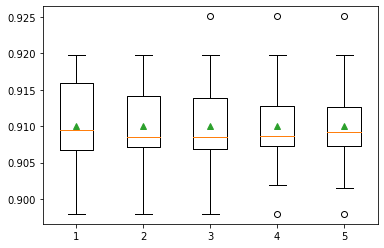

In [50]:
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=42)
	# create model
	model = LogisticRegression(random_state=42)
	# evaluate model
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
	return scores
 

# configurations to test
repeats = range(1,6)
results = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores = evaluate_model(X_test, y_test, r)
	# summarize
	print('>%d mean=%.4f se=%.3f' % (r, mean(scores), sem(scores)))
	# store
	results.append(scores)
# plot the results
pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)
pyplot.show()

This indicates the cross validations across and the scores obtained respectively.

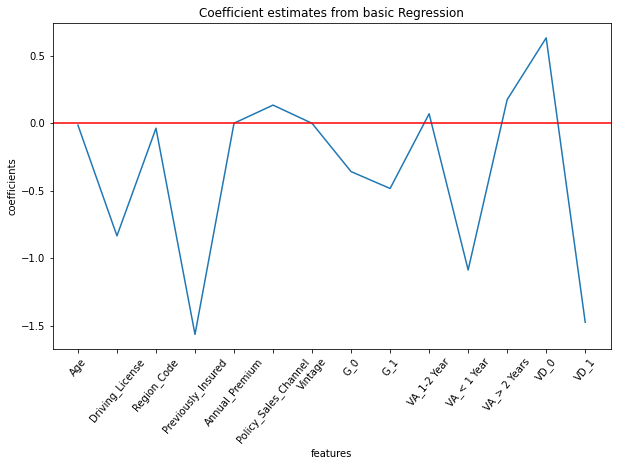

In [53]:
feature_names = df.columns[0:-1]
lg_model= LogisticRegression(random_state=42)
coeffs = lg_model.fit(X_train,y_train).coef_
plt.figure(figsize=(10,6))
plt.plot(range(len(feature_names)),coeffs[0])
plt.axhline(0, color='r', linestyle='solid')
plt.xticks(range(len(feature_names)),feature_names,rotation=50)
plt.title("Coefficient estimates from basic Regression")
plt.ylabel("coefficients")
plt.xlabel("features")
plt.show()

Here we can see how the correlation is between the variables via its coefficent with respect to prediction of our response variable.

In [54]:
logit_model=sm.Logit(y_test,X_test)
result=logit_model.fit()
print(result.summary())

         Current function value: 0.205728
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                28026
Model:                          Logit   Df Residuals:                    28014
Method:                           MLE   Df Model:                           11
Date:                Sun, 17 Jan 2021   Pseudo R-squ.:                  0.7032
Time:                        09:07:19   Log-Likelihood:                -5765.7
converged:                      False   LL-Null:                       -19426.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Age                     -0.0025      0.002     -1.055      0.291      -0.007       0.002
Driving_License          0.2936    

Logit is the function which is used by our logistic regression model, with this we can go for an analysis of the result obtained based on the data we have using logit function. We can thus obtain the coeffecients of all the variables, their standar errors and z value.

### Logistic Regression with regularization

In [55]:
# Grid search cross validation
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
grid={"C":[0.001,0.01,0.1,1,2,5,10], "penalty":["l1","l2"]} # l1 lasso l2 ridge
logreg=LogisticRegression(random_state=42)
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(X_train,y_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.001, 'penalty': 'l2'}
accuracy : 0.9085084248683388


We can now regularize the model using logistic regression. For this its we can use GridSearcgCV and perform a hyperparameter tuning and see the best estimator available.

In [56]:
logreg_cv.best_estimator_

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [57]:
logreg_cv.best_params_

{'C': 0.001, 'penalty': 'l2'}

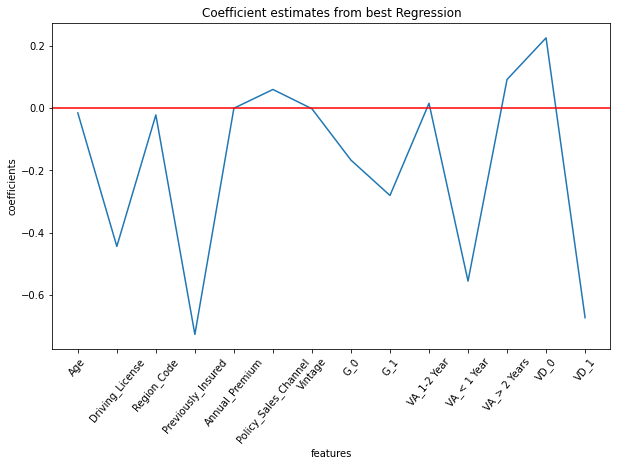

In [58]:
best_model= logreg_cv.best_estimator_
best_coeffs = best_model.fit(X_train,y_train).coef_
plt.figure(figsize=(10,6))
plt.plot(range(len(feature_names)),best_coeffs[0])
plt.axhline(0, color='r', linestyle='solid')
plt.xticks(range(len(feature_names)),feature_names,rotation=50)
plt.title("Coefficient estimates from best Regression")
plt.ylabel("coefficients")
plt.xlabel("features")
plt.show()

After regularizing the parameters we again plot the coeffecients with respect to the new model we obtained and interpret their relationship with the data.

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Confusion matrix:
 [[14013     0]
 [ 2522 11491]]


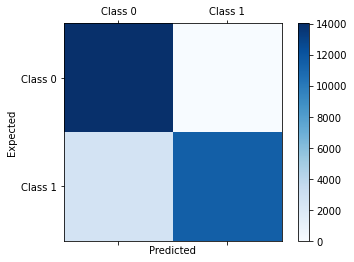

Accuracy 0.910012131592093
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.910012131592093


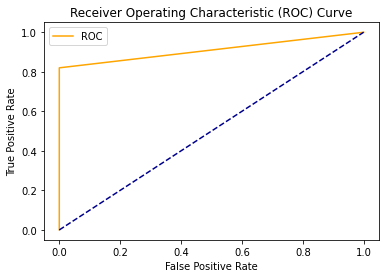

Accuracy of logistic regression classifier on test set: 0.91


In [59]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=42)



model = logreg_cv.best_estimator_
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(model.score(X_test, y_test)))

In [62]:
print("Without regularization",coeffs.flatten())
print("With regularization",best_coeffs[0].flatten())

Without regularization [-1.40928867e-02 -8.33499842e-01 -3.65987144e-02 -1.56302200e+00
  4.25853347e-04  1.34553925e-01 -4.72588889e-04 -3.57946921e-01
 -4.82760749e-01  7.02224899e-02 -1.08588130e+00  1.74951140e-01
  6.32267535e-01 -1.47297520e+00]
With regularization [-1.46571219e-02 -4.44279393e-01 -2.11923018e-02 -7.27385922e-01
  3.06364219e-04  6.07097150e-02 -1.35034638e-03 -1.66582276e-01
 -2.80298087e-01  1.62638195e-02 -5.55966993e-01  9.28228111e-02
  2.26760081e-01 -6.73640443e-01]


In [63]:
dta = {'without_regularization': [-1.40928867e-02 ,-8.33499842e-01 ,-3.65987144e-02 ,-1.56302200e+00,
   4.25853347e-04,  1.34553925e-01 ,-4.72588889e-04 ,-3.57946921e-01,
  -4.82760749e-01  ,7.02224899e-02 ,-1.08588130e+00 , 1.74951140e-01,
   6.32267535e-01, -1.47297520e+00],
        'with_regularization': [-1.46571219e-02 ,-4.44279393e-01, -2.11923018e-02, -7.27385922e-01,
  3.06364219e-04 , 6.07097150e-02 ,-1.35034638e-03 ,-1.66582276e-01,
 -2.80298087e-01 , 1.62638195e-02 ,-5.55966993e-01 , 9.28228111e-02,
  2.26760081e-01 ,-6.73640443e-01]
        }
comparing_models = pd.DataFrame(dta, columns = ['without_regularization','with_regularization'], index=['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
        'Annual_Premium', 'Policy_Sales_Channel', 'Vintage', 'G_0',
        'G_1', 'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0',
        'VD_1'])
# Highlighting coefficient estimates with value '0'

comparing_models

,without_regularization,with_regularization
Age,-0.014093,-0.014657
Driving_License,-0.833500,-0.444279
Region_Code,-0.036599,-0.021192
Previously_Insured,-1.563022,-0.727386
Annual_Premium,0.000426,0.000306
Policy_Sales_Channel,0.134554,0.060710
Vintage,-0.000473,-0.001350
G_0,-0.357947,-0.166582
G_1,-0.482761,-0.280298
VA_1-2 Year,0.070222,0.016264


Finally we can see how the regularized model is performing with basic model. We can clearly see that some variables have improved the correlation while some havent. But overall there is an improvement in the model. But the effect is very less and doesnt hevily improve our Accuracy.

<Figure size 432x288 with 0 Axes>

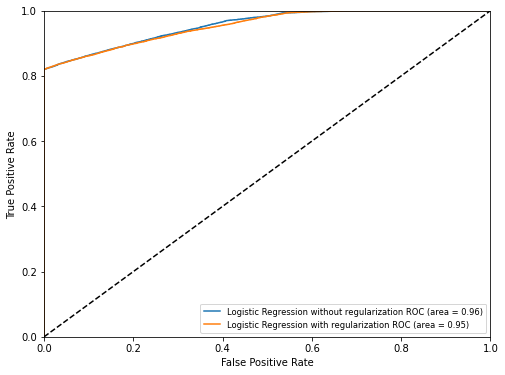

In [64]:
models = [
    {
        'label': 'Logistic Regression without regularization',
        'model': lg_model
    },
    {
        'label': 'Logistic Regression with regularization',
        'model': logreg_cv.best_estimator_
    }
]

plt.clf()
plt.figure(figsize=(8,6))
for m in models:
    m['model'].probability = True
    probas = m['model'].fit(X_train,y_train).predict_proba(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, probas[:, 1])
    roc_auc  = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=0, fontsize='small')
plt.show()

As we can see here, this is the ROC-AUC curve and both of our logistic model are almost similar.

## Linear Classifer with SGD

SGD is used in Linear Classification. It is the Gradient Descent algorithm and we are looking to find a good line to classify our classes.

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
Confusion matrix:
 [[14013     0]
 [ 2531 11482]]


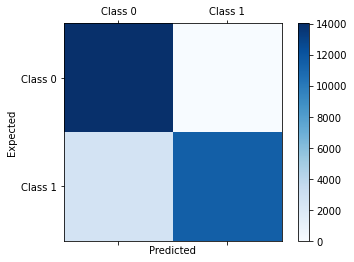

Accuracy 0.9096910012131592
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.9096910012131592


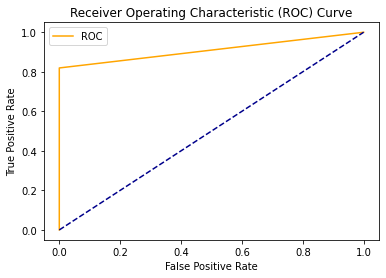

In [65]:

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)


model = SGDClassifier()
model.fit(X_train, y_train)
# Predicting
y_pred = model.predict(X_test)
classif_results()
prcurve()

Our model have given a AUC: 0.9096910012131592

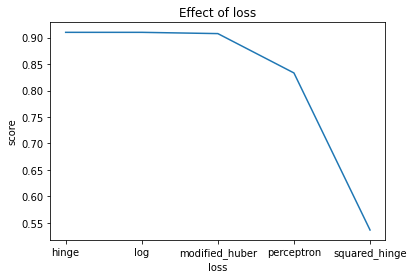

In [66]:
losses = ["hinge", "log", "modified_huber", "perceptron", "squared_hinge"]
scores = []
for loss in losses:
    model = SGDClassifier(loss=loss, penalty="l2", max_iter=1000)
    model.fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))
  
plt.title("Effect of loss")
plt.xlabel("loss")
plt.ylabel("score")
z = np.arange(len(losses))
plt.xticks(z, losses)
plt.plot(z, scores) 

Here we can see, how the effect of loss is with respect to scpre. We can see that hinge is the best one to go forward with.

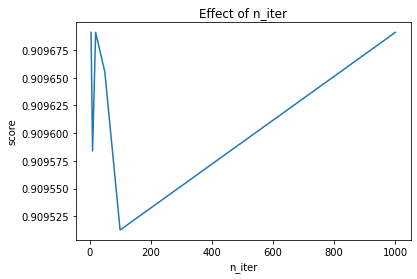

In [67]:
n_iters = [5, 10, 20, 50, 100, 1000]
scores = []
for n_iter in n_iters:
    model = SGDClassifier(loss="hinge", penalty="l2", max_iter=n_iter)
    model.fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))
  
plt.title("Effect of n_iter")
plt.xlabel("n_iter")
plt.ylabel("score")
plt.plot(n_iters, scores) 

This plot tells us how the scores vary across n iterations.

## Naive Bayes

GaussianNB(priors=None, var_smoothing=1e-09)
Confusion matrix:
 [[14013     0]
 [ 2522 11491]]


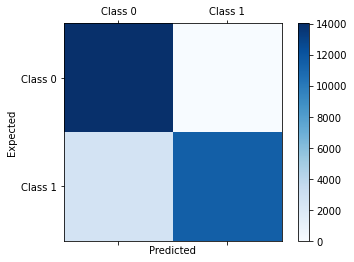

Accuracy 0.910012131592093
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.910012131592093


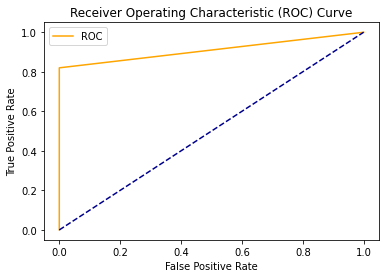

In [69]:


X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=42)


model = GaussianNB()
model.fit(X_train,y_train)

y_pred = model.predict(X_test)

classif_results()
prcurve()



>1 mean=0.9100 se=0.002
>2 mean=0.9100 se=0.001
>3 mean=0.9100 se=0.001
>4 mean=0.9100 se=0.001
>5 mean=0.9100 se=0.001


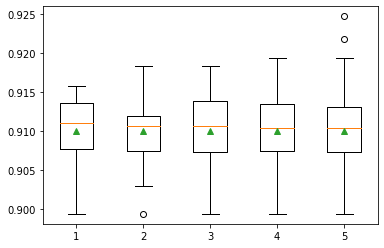

In [71]:

 
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=42)
	# create model
	model = GaussianNB()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
	return scores
 

# configurations to test
repeats = range(1,6)
results = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores = evaluate_model(X_test, y_test, r)
	# summarize
	print('>%d mean=%.4f se=%.3f' % (r, mean(scores), sem(scores)))
	# store
	results.append(scores)
# plot the results
pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)
pyplot.show()

In our Naive Bayes model we have the GaussianNB function that is used for the classification purpose. We have performed a cross validation and obtained the boxplots with respec tto the scores. We can also see how the sandard error vary across each validations.

## SVC

Here initially we are trying to plot boundaries by only taking two variables, annual premium and vintage. And later we go for all variables.

In [21]:
dfx = df.sample(1000)
X = dfx[['Annual_Premium','Vintage']]
y = dfx['Response']

In [22]:
svm_clf = Pipeline([
        ("scaler", StandardScaler()),
        ("linear_svc", LinearSVC(C=1, loss="hinge", random_state=42)),
    ])

svm_clf.fit(X, y)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('linear_svc',
                 LinearSVC(C=1, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
                           loss='hinge', max_iter=1000, multi_class='ovr',
                           penalty='l2', random_state=42, tol=0.0001,
                           verbose=0))],
         verbose=False)

In [23]:
scaler = StandardScaler()
svm_clf1 = LinearSVC(C=1, loss="hinge", random_state=42)
svm_clf2 = LinearSVC(C=100, loss="hinge", random_state=42)

scaled_svm_clf1 = Pipeline([
        ("scaler", scaler),
        ("linear_svc", svm_clf1),
    ])
scaled_svm_clf2 = Pipeline([
        ("scaler", scaler),
        ("linear_svc", svm_clf2),
    ])

scaled_svm_clf1.fit(X, y)
scaled_svm_clf2.fit(X, y)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('linear_svc',
                 LinearSVC(C=100, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
                           loss='hinge', max_iter=1000, multi_class='ovr',
                           penalty='l2', random_state=42, tol=0.0001,
                           verbose=0))],
         verbose=False)

In [24]:
# Convert to unscaled parameters
b1 = svm_clf1.decision_function([-scaler.mean_ / scaler.scale_])
b2 = svm_clf2.decision_function([-scaler.mean_ / scaler.scale_])
w1 = svm_clf1.coef_[0] / scaler.scale_
w2 = svm_clf2.coef_[0] / scaler.scale_
svm_clf1.intercept_ = np.array([b1])
svm_clf2.intercept_ = np.array([b2])
svm_clf1.coef_ = np.array([w1])
svm_clf2.coef_ = np.array([w2])

# Find support vectors (LinearSVC does not do this automatically)
t = y * 2 - 1
support_vectors_idx1 = (t * (X.dot(w1) + b1) < 1).ravel()
support_vectors_idx2 = (t * (X.dot(w2) + b2) < 1).ravel()
svm_clf1.support_vectors_ = X[support_vectors_idx1]
svm_clf2.support_vectors_ = X[support_vectors_idx2]

In [25]:
def plot_svc_decision_boundary(svm_clf, xmin, xmax):
    w = svm_clf.coef_[0]
    b = svm_clf.intercept_[0]

    # At the decision boundary, w0*x0 + w1*x1 + b = 0
    # => x1 = -w0/w1 * x0 - b/w1
    x0 = np.linspace(xmin, xmax, 200)
    decision_boundary = -w[0]/w[1] * x0 - b/w[1]

    margin = 1/w[1]
    gutter_up = decision_boundary + margin
    gutter_down = decision_boundary - margin

    svs = svm_clf.support_vectors_
    plt.scatter(svs.iloc[:, 0], svs.iloc[:, 1], s=180, facecolors='#FFAAAA')
    plt.plot(x0, decision_boundary, "k-", linewidth=2)
    plt.plot(x0, gutter_up, "k--", linewidth=2)
    plt.plot(x0, gutter_down, "k--", linewidth=2)

(0.0, 80000.0, 0.0, 400.0)

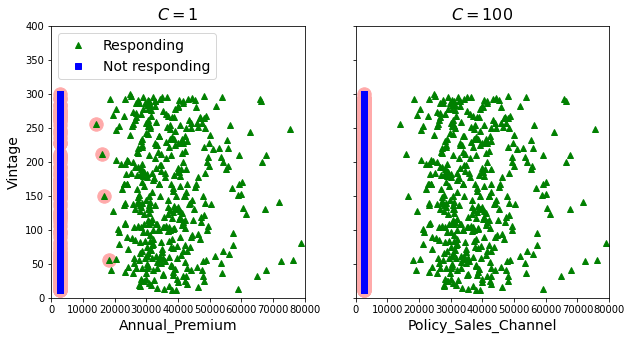

In [32]:
fig, axes = plt.subplots(ncols=2, figsize=(10,5), sharey=True)

plt.sca(axes[0])
plt.plot(X.iloc[:, 0][y==1], X.iloc[:, 1][y==1], "g^", label="Responding")
plt.plot(X.iloc[:, 0][y==0], X.iloc[:, 1][y==0], "bs", label="Not responding")
plot_svc_decision_boundary(svm_clf1, 0, 0.3)
plt.xlabel("Annual_Premium", fontsize=14)
plt.ylabel("Vintage", fontsize=14)
plt.legend(loc="upper left", fontsize=14)
plt.title("$C = {}$".format(svm_clf1.C), fontsize=16)
plt.axis([0, 80000, 0,400])

plt.sca(axes[1])
plt.plot(X.iloc[:, 0][y==1], X.iloc[:, 1][y==1], "g^")
plt.plot(X.iloc[:, 0][y==0], X.iloc[:, 1][y==0], "bs")
plot_svc_decision_boundary(svm_clf2,  0, 0.3)
plt.xlabel("Policy_Sales_Channel", fontsize=14)
plt.title("$C = {}$".format(svm_clf2.C), fontsize=16)
plt.axis([0, 80000, 0, 400])



In [33]:
polynomial_svm_clf = Pipeline([
        ("poly_features", PolynomialFeatures(degree=3)),
        ("scaler", StandardScaler()),
        ("svm_clf", LinearSVC(C=10, loss="hinge", random_state=42))
    ])

polynomial_svm_clf.fit(X, y)

Pipeline(memory=None,
         steps=[('poly_features',
                 PolynomialFeatures(degree=3, include_bias=True,
                                    interaction_only=False, order='C')),
                ('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svm_clf',
                 LinearSVC(C=10, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
                           loss='hinge', max_iter=1000, multi_class='ovr',
                           penalty='l2', random_state=42, tol=0.0001,
                           verbose=0))],
         verbose=False)

In [34]:
def plot_dataset(X, y, axes):
    plt.plot(X.iloc[:, 0][y==1], X.iloc[:, 1][y==1], "g^")
    plt.plot(X.iloc[:, 0][y==0], X.iloc[:, 1][y==0], "bs")
    plt.axis(axes)
    plt.grid(True, which='both')
    plt.xlabel(r"$x_1$", fontsize=20)
    plt.ylabel(r"$x_2$", fontsize=20, rotation=0)

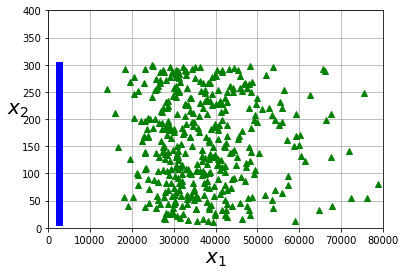

In [35]:
plot_dataset(X, y,[0, 80000, 0, 400])
plt.show()

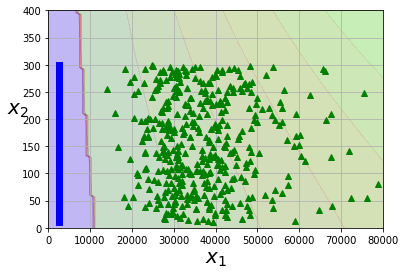

In [36]:

def plot_predictions(clf, axes):
    x0s = np.linspace(axes[0], axes[1], 100)
    x1s = np.linspace(axes[2], axes[3], 100)
    x0, x1 = np.meshgrid(x0s, x1s)
    X = np.c_[x0.ravel(), x1.ravel()]
    y_pred = clf.predict(X).reshape(x0.shape)
    y_decision = clf.decision_function(X).reshape(x0.shape)
    plt.contourf(x0, x1, y_pred, cmap=plt.cm.brg, alpha=0.2)
    plt.contourf(x0, x1, y_decision, cmap=plt.cm.brg, alpha=0.1)

plot_predictions(polynomial_svm_clf, [0, 80000, 0, 400])
plot_dataset(X, y, [0, 80000, 0, 400])

plt.show()

In [37]:
poly_kernel_svm_clf = Pipeline([
        ("scaler", StandardScaler()),
        ("svm_clf", SVC(kernel="poly", degree=2, coef0=1, C=5))
    ])
poly_kernel_svm_clf.fit(X, y)

Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svm_clf',
                 SVC(C=5, break_ties=False, cache_size=200, class_weight=None,
                     coef0=1, decision_function_shape='ovr', degree=2,
                     gamma='scale', kernel='poly', max_iter=-1,
                     probability=False, random_state=None, shrinking=True,
                     tol=0.001, verbose=False))],
         verbose=False)

In [38]:
poly100_kernel_svm_clf = Pipeline([
        ("scaler", StandardScaler()),
        ("svm_clf", SVC(kernel="poly", degree=5, coef0=1, C=5))
    ])
poly100_kernel_svm_clf.fit(X, y)


Pipeline(memory=None,
         steps=[('scaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svm_clf',
                 SVC(C=5, break_ties=False, cache_size=200, class_weight=None,
                     coef0=1, decision_function_shape='ovr', degree=5,
                     gamma='scale', kernel='poly', max_iter=-1,
                     probability=False, random_state=None, shrinking=True,
                     tol=0.001, verbose=False))],
         verbose=False)

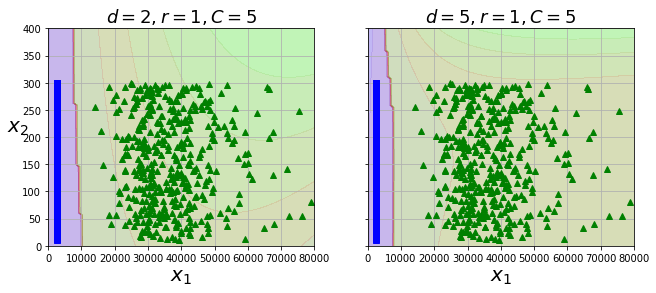

In [40]:

fig, axes = plt.subplots(ncols=2, figsize=(10.5, 4), sharey=True)

plt.sca(axes[0])
plot_predictions(poly_kernel_svm_clf, [0, 80000, 0, 400])
plot_dataset(X, y, [0, 80000, 0, 400])
plt.title(r"$d=2, r=1, C=5$", fontsize=18)

plt.sca(axes[1])
plot_predictions(poly100_kernel_svm_clf, [0, 80000, 0, 400])
plot_dataset(X, y, [0, 80000, 0, 400])
plt.title(r"$d=5, r=1, C=5$", fontsize=18)
plt.ylabel("")

plt.show()

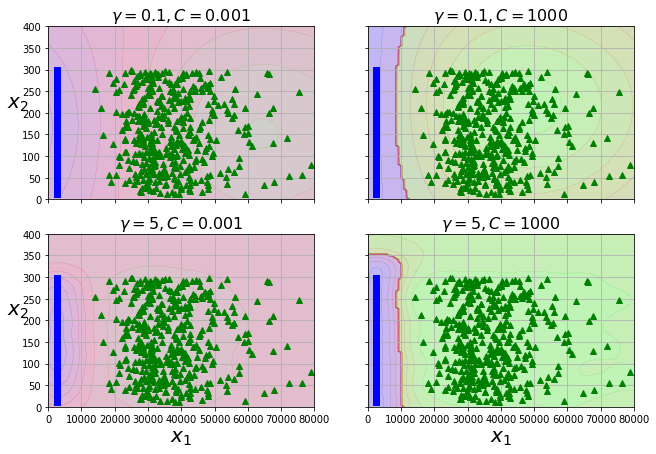

In [43]:
gamma1, gamma2 = 0.1, 5
C1, C2 = 0.001, 1000
hyperparams = (gamma1, C1), (gamma1, C2), (gamma2, C1), (gamma2, C2)

svm_clfs = []
for gamma, C in hyperparams:
    rbf_kernel_svm_clf = Pipeline([
            ("scaler", StandardScaler()),
            ("svm_clf", SVC(kernel="rbf", gamma=gamma, C=C))
        ])
    rbf_kernel_svm_clf.fit(X, y)
    svm_clfs.append(rbf_kernel_svm_clf)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10.5, 7), sharex=True, sharey=True)

for i, svm_clf in enumerate(svm_clfs):
    plt.sca(axes[i // 2, i % 2])
    plot_predictions(svm_clf, [0, 80000, 0, 400])
    plot_dataset(X, y, [0, 80000, 0, 400])
    gamma, C = hyperparams[i]
    plt.title(r"$\gamma = {}, C = {}$".format(gamma, C), fontsize=16)
    if i in (0, 1):
        plt.xlabel("")
    if i in (1, 3):
        plt.ylabel("")

plt.show()

In [ ]:
X

In [21]:
from sklearn.model_selection import train_test_split
X = df.drop(['Response'],axis=1)
y = df['Response']
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=42)

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
Confusion matrix:
 [[14013     0]
 [ 2524 11489]]


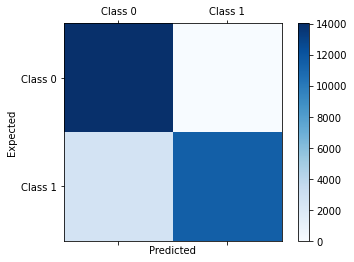

Accuracy 0.9099407692856634
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.9099407692856634


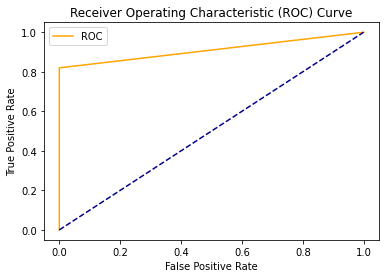

In [22]:
model = SVC()
model.fit(X_train, y_train) 

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

## Regularization on SVM (On a sample)
We have taken a sample for the regularization here as the whole dataset is taking enormous time as SVM is slowly running algorithm.

In [26]:
from sklearn.model_selection import train_test_split
dfk = df.sample(2000)
Xk = dfk.drop(['Response'],axis=1)
yk = dfk['Response']
Xk_train, Xk_test, yk_train, yk_test=train_test_split(Xk,yk,test_size=0.3,random_state=42)

sc_X = StandardScaler()
X_train = sc_X.fit_transform(Xk_train)
X_test = sc_X.transform(Xk_test)

In [27]:
from sklearn.model_selection import GridSearchCV 
  
# defining parameter range 
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']}  
  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(Xk_train, yk_train) 

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.504, total=   0.1s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.504, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.500, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.504, total=   0.1s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:   26.8s finished


GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [28]:
# print best parameter after tuning 
print(grid.best_params_) 
  
# print how our model looks after hyper-parameter tuning 
print(grid.best_estimator_) 

{'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf'}
SVC(C=0.1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


## KNN Classifer

In [29]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

Minimum error:- 0.09498322985798902 at K = 27


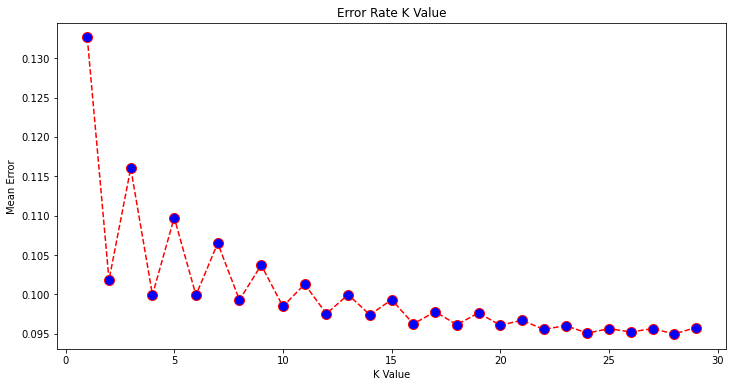

In [30]:
error = []
# Calculating error for K values between 1 and 30
for i in range(1, 30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

plt.figure(figsize=(12, 6))
plt.plot(range(1, 30), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')
print("Minimum error:-",min(error),"at K =",error.index(min(error)))

Using this we can actually get how the neighbours can be taken using the neigbours that contribute the least mean error.

[[13878   103]
 [ 2578 11467]]
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     13981
           1       0.99      0.82      0.90     14045

    accuracy                           0.90     28026
   macro avg       0.92      0.90      0.90     28026
weighted avg       0.92      0.90      0.90     28026

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
Confusion matrix:
 [[13878   103]
 [ 2578 11467]]


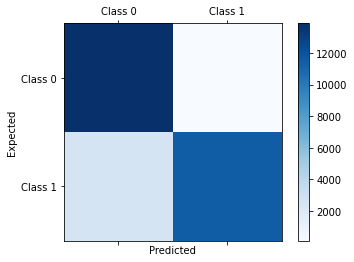

Accuracy 0.9043388282309284
              precision    recall  f1-score   support

           0       0.84      0.99      0.91     13981
           1       0.99      0.82      0.90     14045

    accuracy                           0.90     28026
   macro avg       0.92      0.90      0.90     28026
weighted avg       0.92      0.90      0.90     28026

AUC Score: 
0.9045399965456858


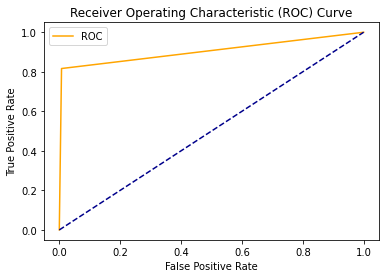

In [31]:

classifier = KNeighborsClassifier(n_neighbors=27)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

## Decesion Tree 

We take two variables initially and try to visualize through how our algorithm works and latter perform classification on all the variables.

In [34]:
X = df[['Annual_Premium','Vintage']]
y = df['Response']


tree_clf = DecisionTreeClassifier(max_depth=2, random_state=42)
tree_clf.fit(X, y)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

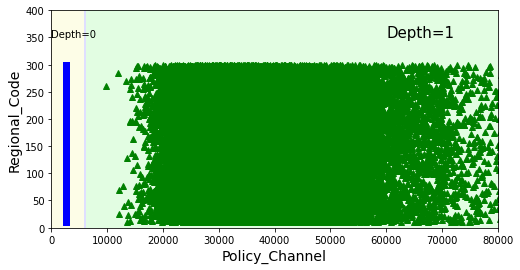

In [42]:
def plot_decision_boundary(clf, X, y, axes=[0, 80000, 0, 400], iris=True, legend=False, plot_training=True):
    x1s = np.linspace(axes[0], axes[1], 100)
    x2s = np.linspace(axes[2], axes[3], 100)
    x1, x2 = np.meshgrid(x1s, x2s)
    X_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(X_new).reshape(x1.shape)
    custom_cmap = ListedColormap(['#fafab0','#9898ff','#a0faa0'])
    plt.contourf(x1, x2, y_pred, alpha=0.3, cmap=custom_cmap)
    if not iris:
        custom_cmap2 = ListedColormap(['#7d7d58','#4c4c7f','#507d50'])
        plt.contour(x1, x2, y_pred, cmap=custom_cmap2, alpha=0.8)
    if plot_training:
        plt.plot(X.iloc[:, 0][y==1], X.iloc[:, 1][y==1], "g^", label="Responding")
        plt.plot(X.iloc[:, 0][y==0], X.iloc[:, 1][y==0], "bs", label="Not responding")
        plt.axis(axes)
    if iris:
        plt.xlabel("Policy_Channel", fontsize=14)
        plt.ylabel("Regional_Code", fontsize=14)
    else:
        plt.xlabel(r"$x_1$", fontsize=18)
        plt.ylabel(r"$x_2$", fontsize=18, rotation=0)
    if legend:
        plt.legend(loc="lower right", fontsize=14)


plt.figure(figsize=(8, 4))
plot_decision_boundary(tree_clf, X, y)

plt.text(0.01, 350, "Depth=0", fontsize=10)
plt.text(60000,350, "Depth=1", fontsize=15)


plt.show()

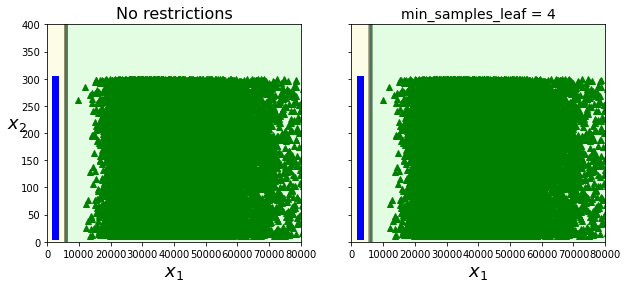

In [43]:
deep_tree_clf1 = DecisionTreeClassifier(random_state=42)
deep_tree_clf2 = DecisionTreeClassifier(min_samples_leaf=4, random_state=42)
deep_tree_clf1.fit(X, y)
deep_tree_clf2.fit(X, y)

fig, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)
plt.sca(axes[0])
plot_decision_boundary(deep_tree_clf1, X, y, axes=[0, 80000, 0, 400], iris=False)
plt.title("No restrictions", fontsize=16)
plt.sca(axes[1])
plot_decision_boundary(deep_tree_clf2, X, y, axes=[0, 80000, 0, 400], iris=False)
plt.title("min_samples_leaf = {}".format(deep_tree_clf2.min_samples_leaf), fontsize=14)
plt.ylabel("")
plt.show()

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Confusion matrix:
 [[12092  1921]
 [ 1797 12216]]


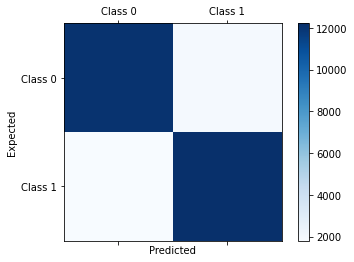

Accuracy 0.8673374723471062
              precision    recall  f1-score   support

           0       0.87      0.86      0.87     14013
           1       0.86      0.87      0.87     14013

    accuracy                           0.87     28026
   macro avg       0.87      0.87      0.87     28026
weighted avg       0.87      0.87      0.87     28026

AUC Score: 
0.8673374723471062


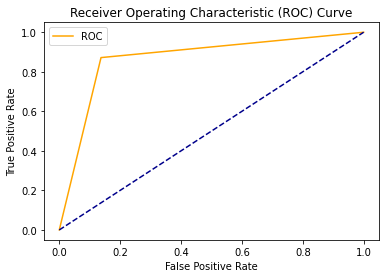

In [45]:
from sklearn.model_selection import train_test_split

X = df.drop(['Response'],axis=1)
y = df['Response']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)


model = DecisionTreeClassifier()
model.fit(X_train, y_train) 

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

In [46]:
grid={ "criterion" : ['gini', 'entropy'], "max_depth" : [2,4,6,8,10,12]}
decreg=DecisionTreeClassifier(random_state=42)
decreg=GridSearchCV(decreg,grid,cv=10)
decreg.fit(X_train,y_train)

print("tuned hpyerparameters :(best parameters) ",decreg.best_params_)
print("accuracy :",decreg.best_score_)
print("best estimator :",decreg.best_estimator_)

tuned hpyerparameters :(best parameters)  {'criterion': 'gini', 'max_depth': 2}
accuracy : 0.9085084248683388
best estimator : DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')
Confusion matrix:
 [[14013     0]
 [ 2522 11491]]


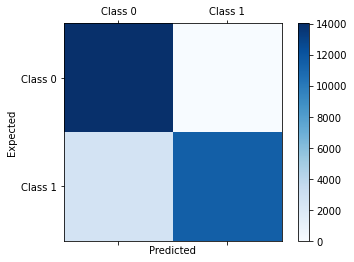

Accuracy 0.910012131592093
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.910012131592093


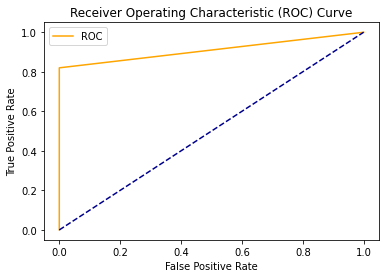

In [47]:
model = decreg.best_estimator_
model.fit(X_train, y_train) 

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

<Figure size 432x288 with 0 Axes>

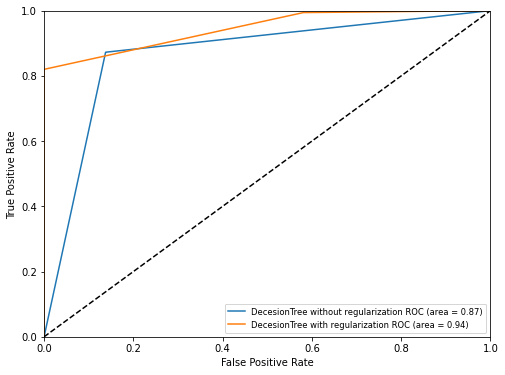

In [48]:
models = [
    {
        'label': 'DecesionTree without regularization',
        'model': DecisionTreeClassifier()
    },
    {
        'label': 'DecesionTree with regularization',
        'model': decreg.best_estimator_
    }
]

plt.clf()
plt.figure(figsize=(8,6))
for m in models:
    m['model'].probability = True
    probas = m['model'].fit(X_train,y_train).predict_proba(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, probas[:, 1])
    roc_auc  = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=0, fontsize='small')
plt.show()

## Voting 

We have performed both hard as well as soft voting here.

In [42]:

# hard voting
log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)
svm_clf = SVC(gamma="scale", random_state=42)

voting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
    voting='hard')

In [43]:
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3, random_state=42)


In [44]:
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=42,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     ccp_alpha=0.0,
                                                     class_weight=None,
                                               

In [45]:
from sklearn.metrics import accuracy_score

for clf in (log_clf, rnd_clf, svm_clf, voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.910012131592093
RandomForestClassifier 0.8981303075715407
SVC 0.910012131592093
VotingClassifier 0.910012131592093


In [46]:
# Soft voting:


log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)
svm_clf = SVC(gamma="scale", probability=True, random_state=42)

voting_clf = VotingClassifier(
    estimators=[('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
    voting='soft')
voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=42,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     ccp_alpha=0.0,
                                                     class_weight=None,
                                               

In [47]:
from sklearn.metrics import accuracy_score

for clf in (log_clf, rnd_clf, svm_clf, voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.910012131592093
RandomForestClassifier 0.8981303075715407
SVC 0.910012131592093
VotingClassifier 0.910012131592093


## Bagging

In [48]:
bag_clf = BaggingClassifier(
    DecisionTreeClassifier(random_state=42), n_estimators=500,
    max_samples=100, bootstrap=True, random_state=42)
bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)

In [49]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred))

0.910012131592093


In [50]:
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)
y_pred_tree = tree_clf.predict(X_test)
print(accuracy_score(y_test, y_pred_tree))

0.8664811246699493


In [51]:
classif_results()
prcurve()

NameError: ignored

## Random Forest

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Confusion matrix:
 [[13342   671]
 [ 2208 11805]]


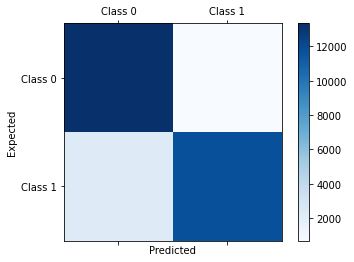

Accuracy 0.8972739598943837
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     14013
           1       0.95      0.84      0.89     14013

    accuracy                           0.90     28026
   macro avg       0.90      0.90      0.90     28026
weighted avg       0.90      0.90      0.90     28026

AUC Score: 
0.8972739598943837


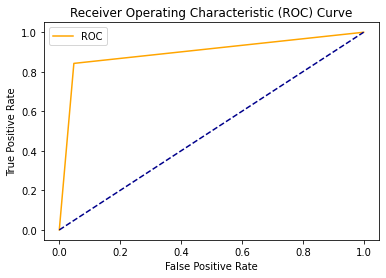

In [59]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state = 42)


model = RandomForestClassifier()
model.fit(X_train, y_train) 

y_pred = model.predict(X_test)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

In [62]:
from sklearn.model_selection import RandomizedSearchCV


In [63]:
random_search = {'criterion': ['entropy', 'gini'],
               'max_depth': [2,3,4,5,6,7,10],
               'min_samples_leaf': [4, 6, 8],
               'min_samples_split': [5, 7,10],
               'n_estimators': [300]}

clf = RandomForestClassifier()
model = RandomizedSearchCV(estimator = clf, param_distributions = random_search, n_iter = 10, 
                               cv = 4, verbose= 1, random_state= 101, n_jobs = -1)
model.fit(X_train,y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:  2.9min finished


RandomizedSearchCV(cv=4, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [64]:
model

RandomizedSearchCV(cv=4, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

RandomizedSearchCV(cv=4, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

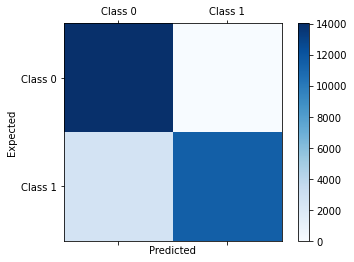

Accuracy 0.910012131592093
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.910012131592093


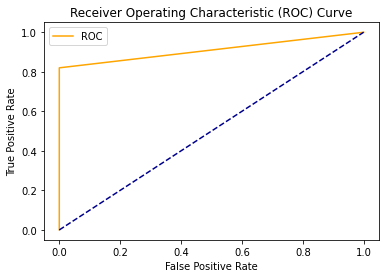

In [65]:
y_pred=model.predict(X_test)

classif_results()
prcurve()

## Adaboost

Here, we go for boosting technique called Adaboost to see if we can bring on any more better accuracy for our model.

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=None,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                       

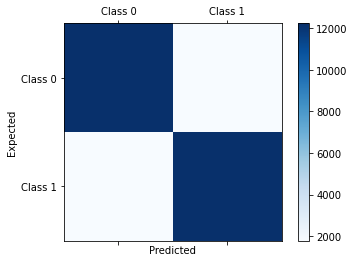

Accuracy 0.8720830657246842
              precision    recall  f1-score   support

           0       0.87      0.87      0.87     14013
           1       0.87      0.87      0.87     14013

    accuracy                           0.87     28026
   macro avg       0.87      0.87      0.87     28026
weighted avg       0.87      0.87      0.87     28026

AUC Score: 
0.8720830657246843


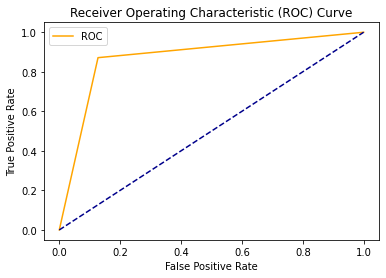

In [72]:
model = AdaBoostClassifier(
    DecisionTreeClassifier(),random_state=42)
model.fit(X_train, y_train)

y_pred=model.predict(X_test)

classif_results()
prcurve()

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='gini',
                                                         max_depth=None,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                       

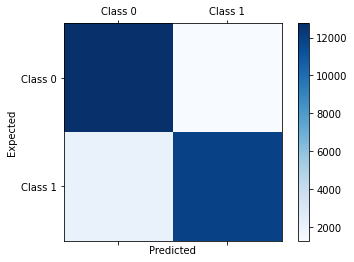

Accuracy 0.8820381074716335
              precision    recall  f1-score   support

           0       0.86      0.91      0.89     14013
           1       0.90      0.85      0.88     14013

    accuracy                           0.88     28026
   macro avg       0.88      0.88      0.88     28026
weighted avg       0.88      0.88      0.88     28026

AUC Score: 
0.8820381074716335


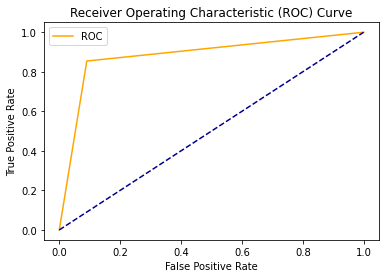

In [73]:
model = AdaBoostClassifier(
    DecisionTreeClassifier(), n_estimators=200,
    algorithm="SAMME.R", learning_rate=0.5, random_state=42)
model.fit(X_train, y_train)

y_pred=model.predict(X_test)

classif_results()
prcurve()

## XG Boost

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
Confusion matrix:
 [[14011     2]
 [ 2518 11495]]


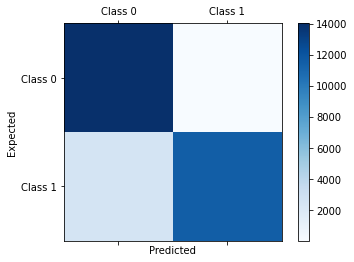

Accuracy 0.9100834938985228
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     14013
           1       1.00      0.82      0.90     14013

    accuracy                           0.91     28026
   macro avg       0.92      0.91      0.91     28026
weighted avg       0.92      0.91      0.91     28026

AUC Score: 
0.9100834938985229


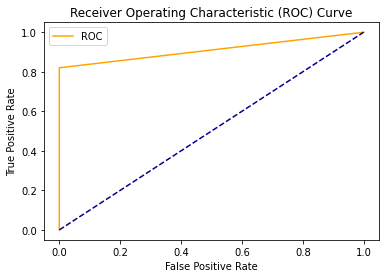

In [57]:
import re

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

X_train.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_train.columns.values]
X_test.columns = [regex.sub("_", col) if any(x in str(col) for x in set(('[', ']', '<'))) else col for col in X_test.columns.values]

xg_model = XGBClassifier()
xg_model.fit(X_train, y_train) 

y_pred = xg_model.predict(X_test)

model = XGBClassifier()
model.fit(X_train, y_train) 

y_pred = model.predict(X_test)


cm = confusion_matrix(y_test,y_pred)


classif_results()
prcurve()

Finally we perform XGboost and see that it working better. But to exactly understanding which algo had performed the best overall on our test data we go for a final comparison of all classifers and ensemble methods we performed.

## Comparing all classifers

<Figure size 432x288 with 0 Axes>

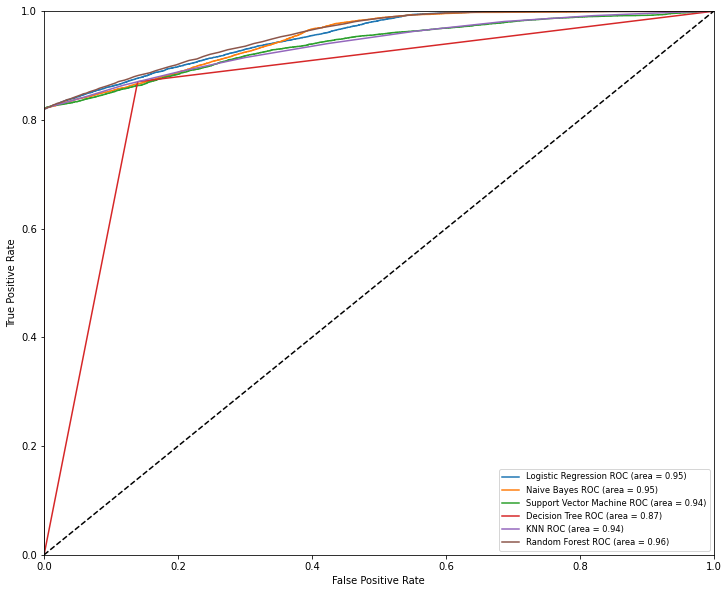

In [22]:
X = df.drop(['Response'],axis=1)
y = df['Response']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state = 42)


log_model = LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

knn_model = KNeighborsClassifier(n_neighbors=27)

nb_model = GaussianNB()
svc_model = SVC(C=0.1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
des_model = DecisionTreeClassifier(criterion="entropy")
random_model = RandomForestClassifier()


models = [
    {
        'label': 'Logistic Regression',
        'model': log_model
    },
    {
        'label': 'Naive Bayes',
        'model': nb_model
    },
    {
        'label': 'Support Vector Machine',
        'model': svc_model
    },
    {
        'label': 'Decision Tree',
        'model': des_model
    },
        
    {
        'label': 'KNN',
        'model': knn_model
    },
    {
        'label': 'Random Forest',
        'model': random_model
    }
]

from sklearn.metrics import roc_curve, roc_auc_score, auc

plt.clf()
plt.figure(figsize=(12,10))
for m in models:
    m['model'].probability = True
    probas = m['model'].fit(X_train,y_train).predict_proba(X_test)
    fpr, tpr, thresholds = roc_curve(y_test, probas[:, 1])
    roc_auc  = auc(fpr, tpr)
    plt.plot(fpr, tpr, label='%s ROC (area = %0.2f)' % (m['label'], roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc=0, fontsize='small')
plt.show()

We can from here see that Random Forest Model has covered most of the area in our ROC-AUC curve and the score remains similar across all classifers. With this diagram we can come to a conclusion that Random Forest has performed the best out of all the classifers. And if we were to make a deployment of model for this problem, we would go ahead with Random Forest. 

# PCA

We are performing PCA to reduce the dimmensions of our dataset so we can still go for classifcation with lesser features and not affecting much of the accuracy.

In [24]:

y = df['Response'].copy()
X = df.drop('Response', axis=1).copy()
sc_X = StandardScaler()
X = sc_X.fit_transform(X)

Text(0.5, 1.0, 'components vs explained varaiance')

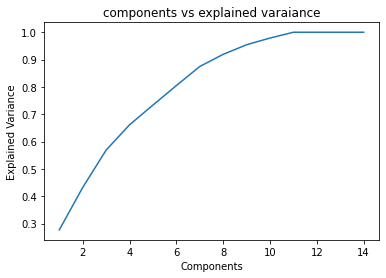

In [25]:
pca = PCA()
pca.fit(X)
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

plt.plot(range(1, exp_var_cumul.shape[0] + 1),
    exp_var_cumul)

plt.xlabel('Components')
plt.ylabel('Explained Variance')

plt.title('components vs explained varaiance')

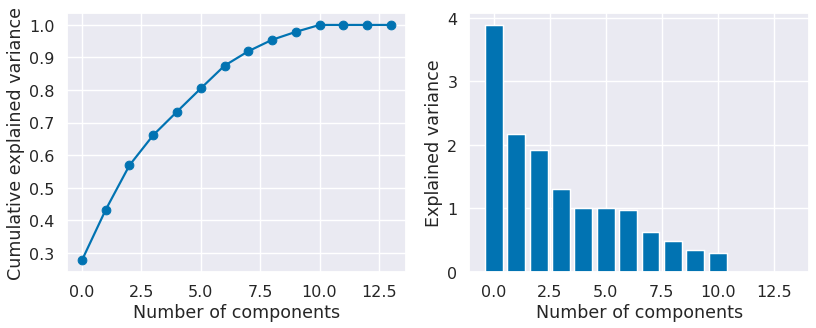

In [27]:
pca = PCA().fit(X)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi=70, facecolor='w', edgecolor='k')
ax0, ax1 = axes.flatten()

sns.set('talk', palette='colorblind')

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 12}


ax0.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
ax0.set_xlabel('Number of components')
ax0.set_ylabel('Cumulative explained variance');

ax1.bar(range(X.shape[1]),pca.explained_variance_)
ax1.set_xlabel('Number of components')
ax1.set_ylabel('Explained variance');

plt.tight_layout()
plt.show()

We can see the cummilative frequency with the components used. Our aim is to preserve 90-95% of the variance so that its good to go for classifications. We can see almost 7-8 components cover them. We can also see at 10 components we reach almost 100% of the variance and hence the rest components are not needed. That can be visualized better in the bar graph.

[]

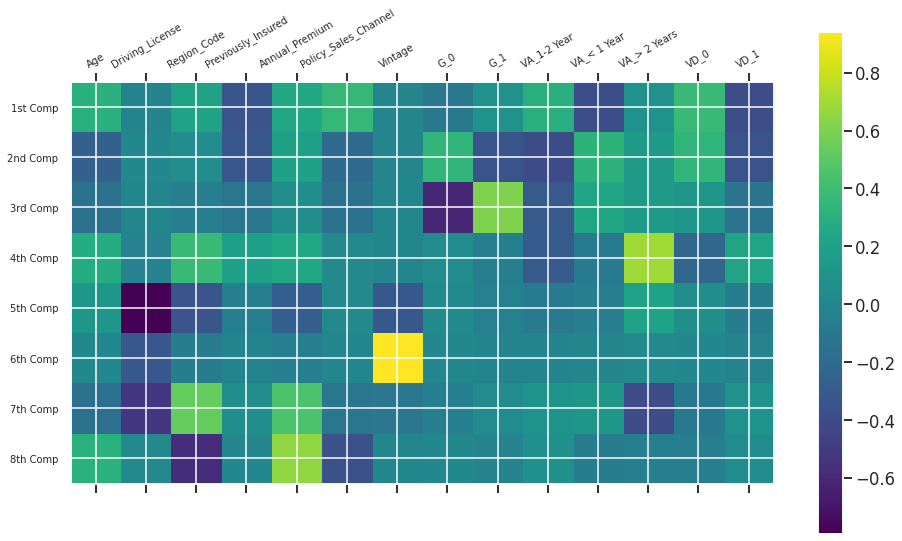

In [28]:
pca = PCA(8).fit((X))

X_pca=pca.transform((X)) 


plt.rcParams["figure.figsize"] = [16,9]



plt.matshow(pca.components_,cmap='viridis')
plt.yticks([0,1,2,3,4,5,6,7],['1st Comp','2nd Comp','3rd Comp','4th Comp','5th Comp','6th Comp','7th Comp','8th Comp'],fontsize=10)

plt.colorbar()
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13],['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'Vintage',  'G_0',
       'G_1', 'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1'],fontsize=10,rotation=30)
plt.tight_layout()

plt.plot()

This tells how our components are related with respect to the features.

In [29]:
VariablesNoTarget = ['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'Vintage',  'G_0',
       'G_1', 'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1']


def highlight_cols(s, coldict):
    if s.name in coldict.keys():
        return ['background-color: {}'.format(coldict[s.name])] * len(s)
    return [''] * len(s)

def ExtractColumn(lst,j): 
    return [item[j] for item in lst] 



PCA_vars = [0]*len(VariablesNoTarget)

for i, feature in zip(range(len(VariablesNoTarget)),VariablesNoTarget):
    x = ExtractColumn(pca.components_,i)
    if ((max(x) > 0.4) | (min(x) < -0.4)):
        if abs(max(x)) > abs(min(x)):
            PCA_vars[i] = max(x)
        else:
            PCA_vars[i] = min(x)                 
    else:
        PCA_vars[i] = 0

PCA_vars = pd.DataFrame(list(zip(VariablesNoTarget,PCA_vars)),columns=('Name','Max absolute contribution'),index=range(1,15,1))      
PCA_vars = PCA_vars[(PCA_vars['Max absolute contribution']!=0)]
PCA_vars

,Name,Max absolute contribution
2,Driving_License,-0.793498
3,Region_Code,-0.564599
5,Annual_Premium,0.656641
7,Vintage,0.942215
8,G_0,-0.607727
9,G_1,0.607727
12,VA_> 2 Years,0.696476


This table tells about the way the features are contributing and the essential features needed to proceed with.

In [21]:
from sklearn.decomposition import PCA

sc_X = StandardScaler()
X = sc_X.fit_transform(X)

pca = PCA(n_components = 8)
X2D = pca.fit_transform(X)

In [22]:
X2D[:5]

array([[ 0.84329002, -0.80657914,  0.77027967, -1.28516674,  0.29029373,
         0.70696883, -0.95904534,  0.02069509],
       [ 0.8710038 , -0.74570632,  0.77433914, -1.1896503 ,  0.02157972,
         1.05628706, -0.7789925 , -0.23449972],
       [ 0.86165751, -0.83830879,  0.75894886, -1.33379935,  0.33980054,
         0.71517624, -1.04687578,  0.05116096],
       [ 0.94573718, -0.84208335,  0.72877198, -1.21432957,  0.62245401,
        -0.38221067, -0.79270944, -0.08758266],
       [ 1.01610925, -0.89403369,  0.69650537, -1.09578498,  0.73804679,
        -0.7105274 , -0.74306448,  0.00456961]])

In [23]:

pca.components_

array([[ 3.10019821e-01, -1.36698574e-02,  2.09351791e-01,
        -3.42172267e-01,  2.41538194e-01,  3.63070758e-01,
        -1.16520954e-03, -9.69725262e-02,  9.69725262e-02,
         2.92457808e-01, -3.75148584e-01,  9.93705803e-02,
         3.85796901e-01, -3.85796901e-01],
       [-2.58264892e-01,  1.70645758e-02,  5.56891363e-02,
        -3.20637920e-01,  1.96042167e-01, -1.84549777e-01,
        -9.50882392e-04,  3.40040977e-01, -3.40040977e-01,
        -3.88070535e-01,  3.31634595e-01,  1.48618113e-01,
         3.46902518e-01, -3.46902518e-01],
       [-1.41988544e-01, -1.29285299e-04, -5.35973646e-02,
        -1.08740180e-01,  6.62137733e-02, -1.43844146e-01,
         3.52801354e-03, -6.07727368e-01,  6.07727368e-01,
        -3.01291324e-01,  2.34949102e-01,  1.53408524e-01,
         1.26248679e-01, -1.26248679e-01],
       [ 2.81762977e-01, -2.38281091e-02,  3.73775332e-01,
         1.88416478e-01,  2.39866612e-01,  2.30475655e-02,
         5.93368788e-03,  4.48879438e-02, -4.

In [24]:
pca.explained_variance_ratio_

array([0.27686159, 0.15527205, 0.13659068, 0.09268575, 0.07209146,
       0.0713745 , 0.06989988, 0.04438569])

In [25]:
1 - pca.explained_variance_ratio_.sum()

0.08083839303606022

In [26]:
principal_df = pd.DataFrame(X2D,columns=['pc1','pc2','pc3','pc4','pc5','pc6','pca7','pca8'])

finaldf= pd.concat([principal_df,df[['Response']]],axis=1)

In [27]:
finaldf.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pca7,pca8,Response
0,0.843290,-0.806579,0.770280,-1.285167,0.290294,0.706969,-0.959045,0.020695,0
1,0.871004,-0.745706,0.774339,-1.189650,0.021580,1.056287,-0.778992,-0.234500,0
2,0.861658,-0.838309,0.758949,-1.333799,0.339801,0.715176,-1.046876,0.051161,0
3,0.945737,-0.842083,0.728772,-1.214330,0.622454,-0.382211,-0.792709,-0.087583,0
4,1.016109,-0.894034,0.696505,-1.095785,0.738047,-0.710527,-0.743064,0.004570,0


This is the final dataset that we have obtained with 8 features. This can be used now for further clustering or classification.

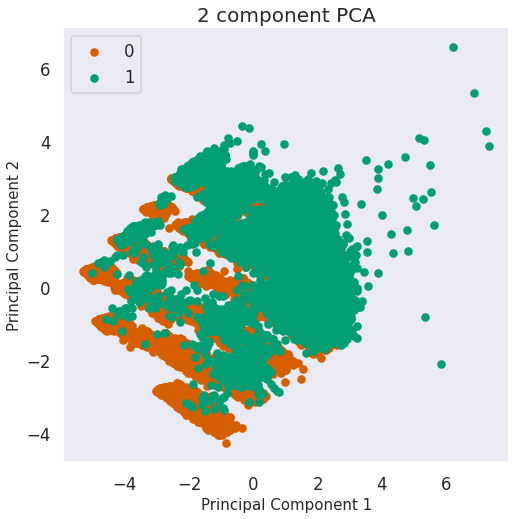

In [33]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0,1]
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = finaldf['Response'] == target
    ax.scatter(finaldf.loc[indicesToKeep, 'pc1']
               , finaldf.loc[indicesToKeep, 'pc2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

Simple plot indicationg first two principal components.

In [102]:
df.columns

Index(['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'Vintage', 'G_0', 'G_1',
       'VA_1-2 Year', 'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1',
       'Response'],
      dtype='object')

In [34]:
pca.explained_variance_ratio_

array([0.27686159, 0.15527205, 0.13659068, 0.09268575, 0.07209146,
       0.0713745 , 0.06989988, 0.04438569])

In [35]:


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    X2D,
    labels=labels,
    dimensions=range(3),
    color=df["Response"]
)
fig.update_traces(diagonal_visible=True)
fig.show()

Three components relation plotting.

In [36]:
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    X2D, x=0, y=1, z=2, color=df['Response'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [38]:


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3) 


pca = PCA(n_components = 8)

In [39]:
X_train = pca.fit_transform(X_train) 
X_test = pca.transform(X_test) 

X_train.shape

(65394, 8)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Confusion matrix:
 [[13167   880]
 [ 2384 11595]]


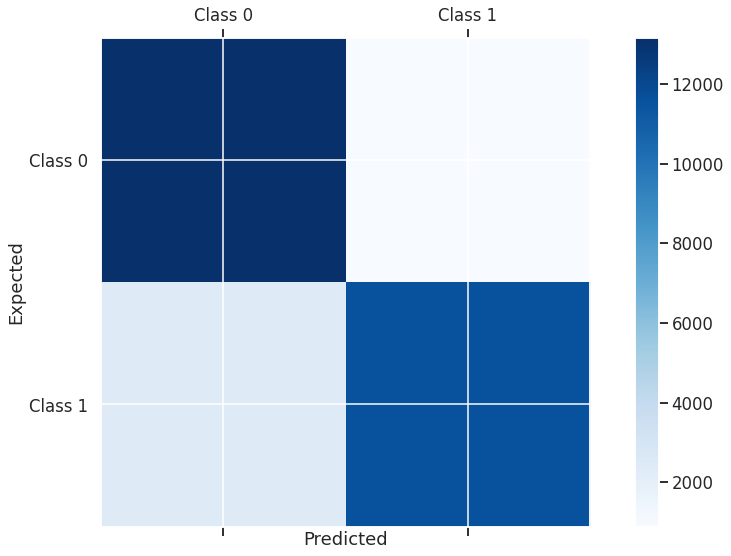

Accuracy 0.883536715906658
              precision    recall  f1-score   support

           0       0.85      0.94      0.89     14047
           1       0.93      0.83      0.88     13979

    accuracy                           0.88     28026
   macro avg       0.89      0.88      0.88     28026
weighted avg       0.89      0.88      0.88     28026

AUC Score: 
0.8834058224600577


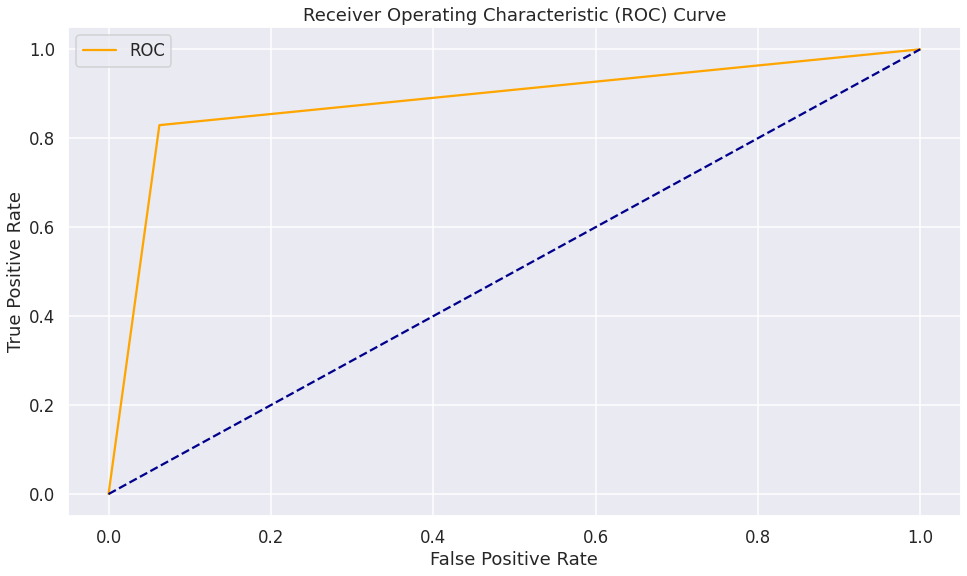

In [40]:
  


model = LogisticRegression(random_state = 0) 
model.fit(X_train, y_train) 

# Predicting the test set result using 
# predict function under LogisticRegression 
y_pred = model.predict(X_test) 

# making confusion matrix between 
# test set of Y and predicted value. 
from sklearn.metrics import confusion_matrix 

cm = confusion_matrix(y_test, y_pred) 

classif_results()
prcurve()

We can observe that even after doing a dimensionality reduction we have reduced features to 8 from 14 and still we managed to only loose 2% of AUC score as compared to model we ran without the feature reduction.

## Compression using PCA

In [113]:

X_train, X_test, y_train, y_test = train_test_split(X, y)

pca = PCA()
pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.90) + 1

In [114]:
d

8

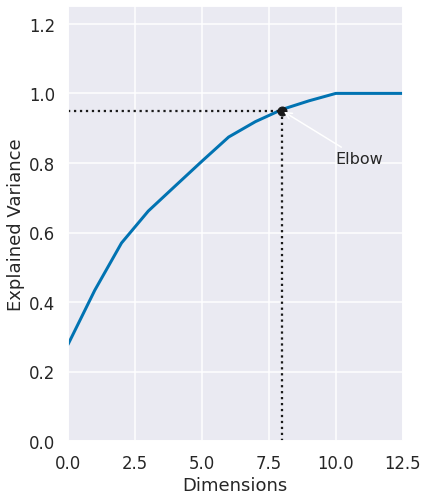

In [115]:
plt.figure(figsize=(6,8))
plt.plot(cumsum, linewidth=3)
plt.axis([0, 12.5, 0, 1.25])
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")
plt.plot([d, d], [0, 0.95], "k:")
plt.plot([0, d], [0.95, 0.95], "k:")
plt.plot(d, 0.95, "ko")
plt.annotate("Elbow", xy=(8,0.95), xytext=(10,0.8),
             arrowprops=dict(arrowstyle="->"), fontsize=16)
plt.grid(True)
plt.show()

In [116]:
pca = PCA(n_components=0.90)
X_reduced = pca.fit_transform(X_train)

In [117]:
pca.n_components_

8

In [118]:
np.sum(pca.explained_variance_ratio_)

0.9188509354564471

## Incremental PCA
Sometimes its not always possible to fit entire dataset to PCA so we can proceed with Incremental PCA.

In [28]:
from sklearn.model_selection import train_test_split

sc_X = StandardScaler()
X = sc_X.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y)


In [19]:


n_batches = 100
inc_pca = IncrementalPCA(n_components=8)
for X_batch in np.array_split(X_train, n_batches):
    print(".", end="") # not shown in the book
    inc_pca.partial_fit(X_batch)

X_reduced = inc_pca.transform(X_train)

....................................................................................................

In [23]:
X_reduced.shape

(70065, 8)

In [22]:
X_recovered_inc_pca = inc_pca.inverse_transform(X_reduced)
X_recovered_inc_pca.shape

(70065, 14)

We can observe that its possible to recover the features we lost during the reduction using the inverse transform function.

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Confusion matrix:
 [[10823   981]
 [ 1883  9668]]


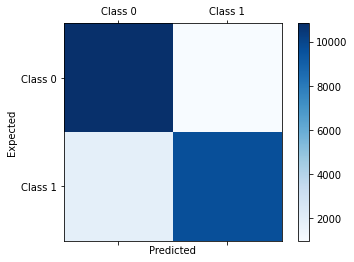

Accuracy 0.8773710126311283
              precision    recall  f1-score   support

           0       0.85      0.92      0.88     11804
           1       0.91      0.84      0.87     11551

    accuracy                           0.88     23355
   macro avg       0.88      0.88      0.88     23355
weighted avg       0.88      0.88      0.88     23355

AUC Score: 
0.8769381948561565


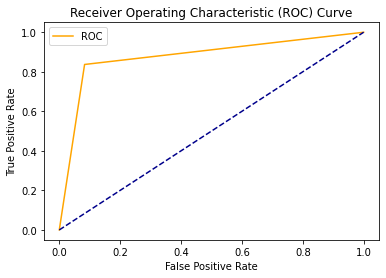

In [25]:
X_train = inc_pca.fit_transform(X_train) 
X_test = inc_pca.transform(X_test) 

  


model = LogisticRegression(random_state = 0) 
model.fit(X_train, y_train) 

# Predicting the test set result using 
# predict function under LogisticRegression 
y_pred = model.predict(X_test) 

# making confusion matrix between 
# test set of Y and predicted value. 
from sklearn.metrics import confusion_matrix 

cm = confusion_matrix(y_test, y_pred) 

classif_results()
prcurve()

# Unsupervised

Here, we are proceeding with the dimmensions we hav eobtained after performing PCA.

## K-means

In [28]:
dfi = finaldf.drop(['Response'],axis=1)
dfi.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pca7,pca8
0,0.843290,-0.806579,0.770280,-1.285167,0.290294,0.706969,-0.959045,0.020695
1,0.871004,-0.745706,0.774339,-1.189650,0.021580,1.056287,-0.778992,-0.234500
2,0.861658,-0.838309,0.758949,-1.333799,0.339801,0.715176,-1.046876,0.051161
3,0.945737,-0.842083,0.728772,-1.214330,0.622454,-0.382211,-0.792709,-0.087583
4,1.016109,-0.894034,0.696505,-1.095785,0.738047,-0.710527,-0.743064,0.004570


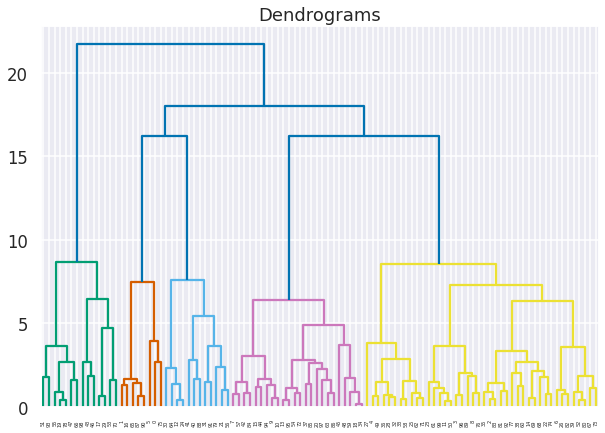

In [47]:
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(dfi.sample(100), method='ward'))

Sample dendogram indication how clustering works on a sample of our datset.

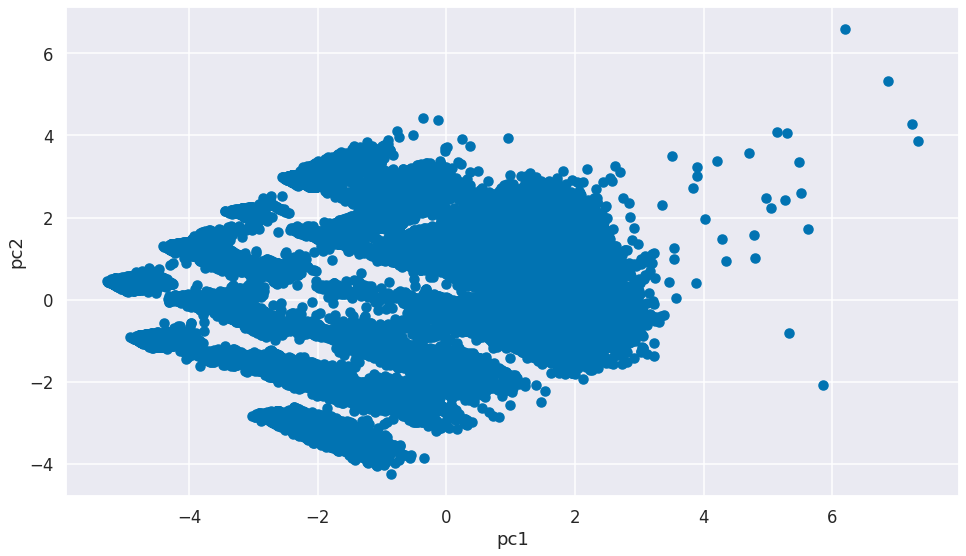

In [48]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()


plt.scatter(dfi['Vintage'],dfi['Annual_Premium'])
plt.xlabel('Vintage')
plt.ylabel('Annual_Premium ')
plt.show()

We have taken forst two components and this is the graph we obtained before we actually perform a clustering.

In [29]:
from sklearn.cluster import KMeans

X = dfi

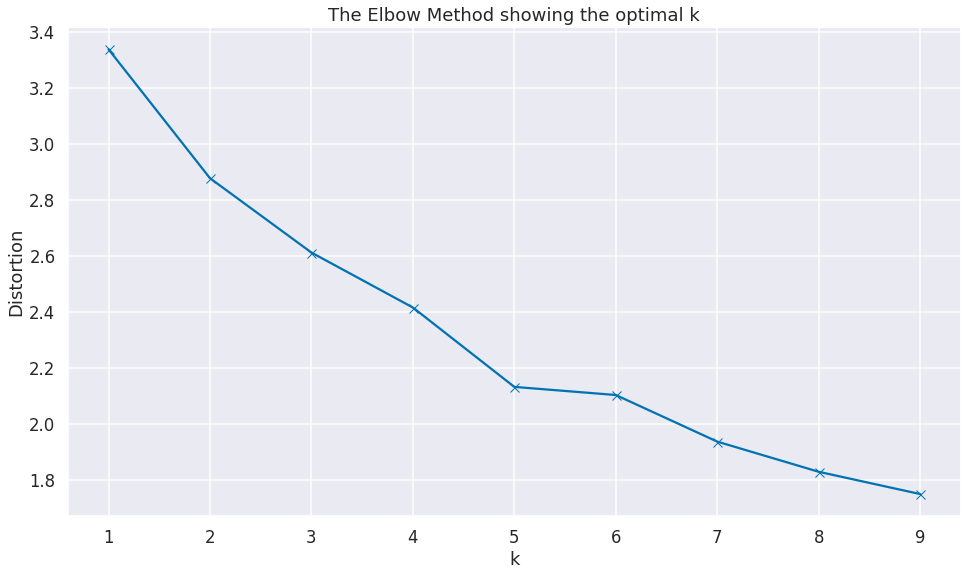

In [49]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt


# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X)
    kmeanModel.fit(X)
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

 

We can go for elbow method to say that we can proceed with 6 as k number.

In [50]:
km1 = KMeans(n_clusters=6, random_state = 1)
y_predicted1 = km1.fit_predict(X)
y_predicted1

array([2, 2, 2, ..., 1, 1, 1], dtype=int32)

In [51]:
dfi["Class"] = y_predicted1

Text(0, 0.5, 'pc2')

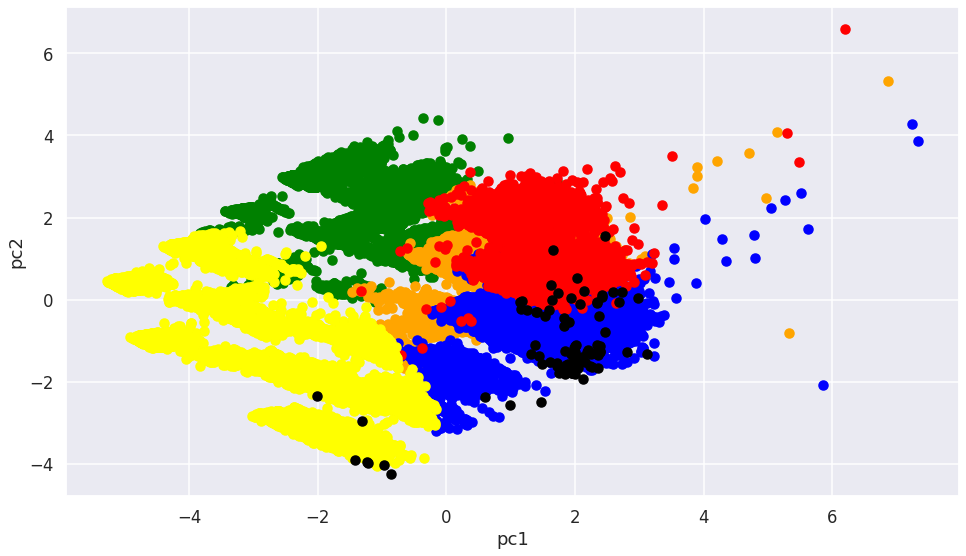

In [53]:
df_1 = dfi[dfi.Class==0]
df_2 = dfi[dfi.Class==1]
df_3 = dfi[dfi.Class==2]
df_4 = dfi[dfi.Class==3]
df_5 = dfi[dfi.Class==4]
df_6 = dfi[dfi.Class==5]


fig = plt.figure()


plt.scatter(df_1['pc1'],df_1['pc2'], color = "green",label="Cluster1")
plt.scatter(df_2['pc1'],df_2['pc2'], color = "orange",label="Cluster2")
plt.scatter(df_3['pc1'],df_3['pc2'], color = "blue",label="Cluster3")
plt.scatter(df_4['pc1'],df_4['pc2'], color = "red",label="Cluster4")
plt.scatter(df_5['pc1'],df_5['pc2'], color = "yellow",label="Cluster5")
plt.scatter(df_6['pc1'],df_6['pc2'], color = "black",label="Cluster6")

plt.xlabel('pc1')
plt.ylabel('pc2')

After performing the kmeans clustering algorithm we can see that how the components we had earlier got clustered into 6 different clusters.

Text(0.5, 0, 'pc3')

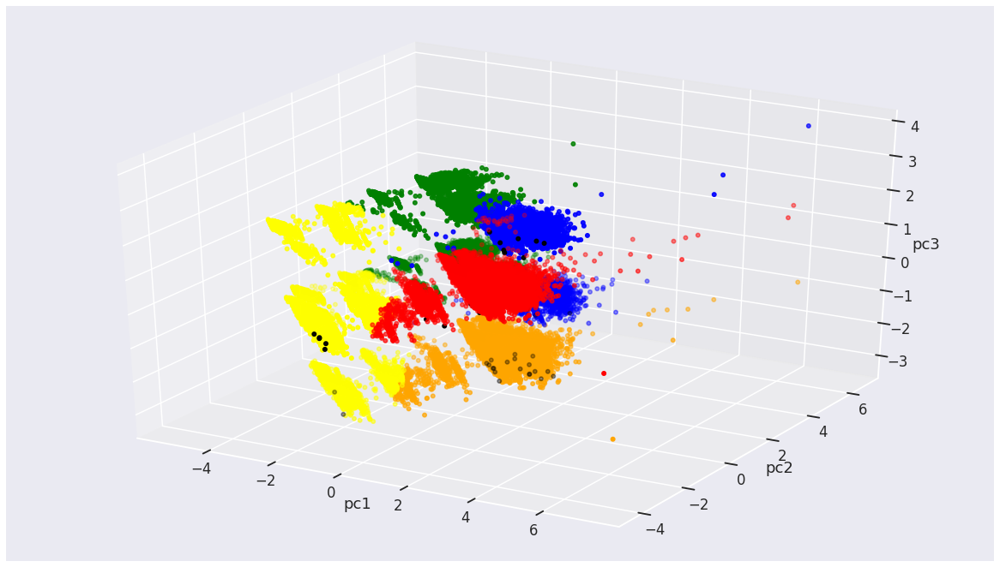

In [55]:
fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_1['pc1'],df_1['pc2'],df_1['pc3'], color = "green",label="Cluster1")
ax.scatter(df_2['pc1'],df_2['pc2'],df_2['pc3'], color = "orange",label="Cluster2")
ax.scatter(df_3['pc1'],df_3['pc2'],df_3['pc3'], color = "red",label="Cluster3")
ax.scatter(df_4['pc1'],df_4['pc2'],df_4['pc3'], color = "blue",label="Cluster4")
ax.scatter(df_5['pc1'],df_5['pc2'],df_5['pc3'], color = "yellow",label="Cluster5")
ax.scatter(df_6['pc1'],df_6['pc2'],df_6['pc3'], color = "black",label="Cluster6")
ax.set_xlabel('pc1')
ax.set_ylabel('pc2')
ax.set_zlabel('pc3')

This is the 3d plot of our clusters.

In [56]:
dfi.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pca7,pca8,Class
0,0.843290,-0.806579,0.770280,-1.285167,0.290294,0.706969,-0.959045,0.020695,2
1,0.871004,-0.745706,0.774339,-1.189650,0.021580,1.056287,-0.778992,-0.234500,2
2,0.861658,-0.838309,0.758949,-1.333799,0.339801,0.715176,-1.046876,0.051161,2
3,0.945737,-0.842083,0.728772,-1.214330,0.622454,-0.382211,-0.792709,-0.087583,2
4,1.016109,-0.894034,0.696505,-1.095785,0.738047,-0.710527,-0.743064,0.004570,2


In [57]:
from sklearn.metrics import silhouette_score
silhouette_score(X, km1.labels_)


0.37337312083467467

We obtain a Silhoutte score based on our clustering.

In [58]:
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X)
                for k in range(1, 10)]

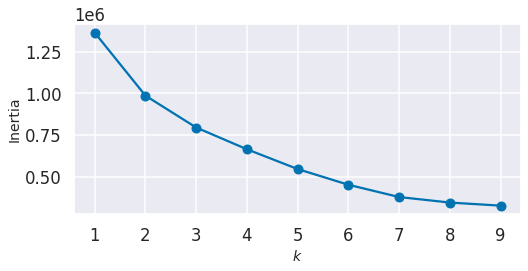

In [59]:
inertias = [model.inertia_ for model in kmeans_per_k]
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)

plt.show()

In [60]:
silhouette_scores = [silhouette_score(X, model.labels_)
                     for model in kmeans_per_k[1:]]
silhouette_scores

[0.35940948905433356,
 0.3429949234233916,
 0.3850471419238876,
 0.3693305799824815,
 0.37337312083467467,
 0.3903452467295772,
 0.34253532403371895,
 0.33891526262299676]

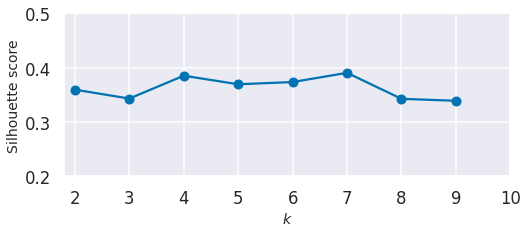

In [62]:
plt.figure(figsize=(8, 3))
plt.plot(range(2, 10), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.axis([1.8, 10, 0.2, 0.5])
plt.show()

Now we can use the Yelloebrick library to visualize the Silhoutte score across different clusters.

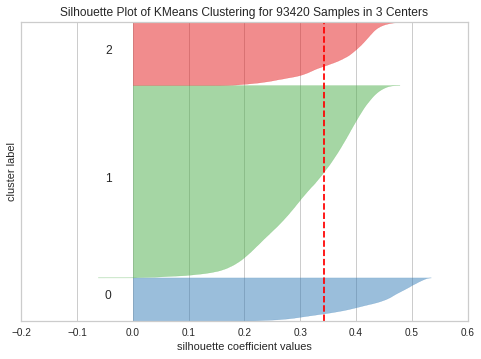

In [66]:
from yellowbrick.cluster import SilhouetteVisualizer

# Instantiate the clustering model and visualizer 
model = KMeans(3)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()  

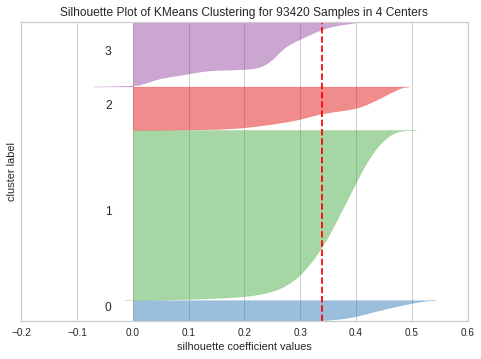

In [30]:
# Instantiate the clustering model and visualizer 
from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(4)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()  

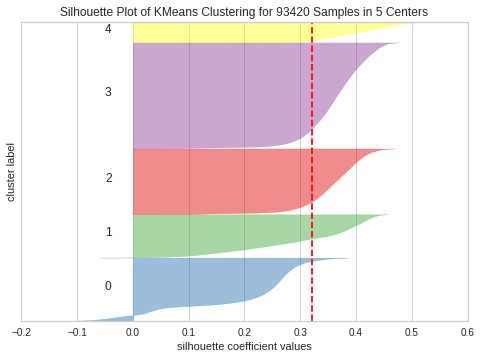

In [31]:
# Instantiate the clustering model and visualizer 
model = KMeans(5)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()  

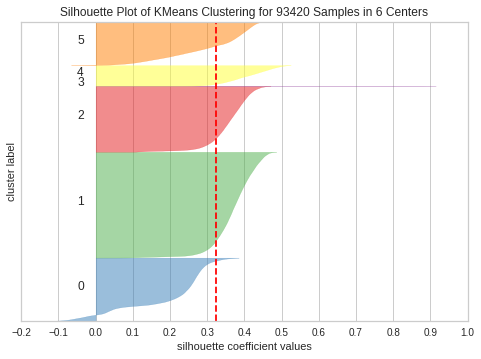

In [32]:
# Instantiate the clustering model and visualizer 
model = KMeans(6)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()  

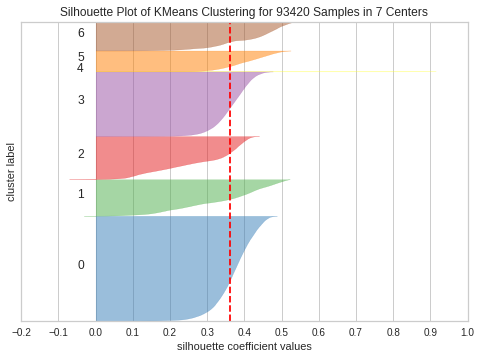

In [33]:
# Instantiate the clustering model and visualizer 
model = KMeans(7)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(X)    # Fit the data to the visualizer
visualizer.poof()  

We can see the comparisons of all the scores here.

In [34]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LogisticRegression


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3) 

pipeline = Pipeline([
    ("kmeans", KMeans(random_state=42)),
    ("log_reg", LogisticRegression(multi_class="ovr", solver="lbfgs", random_state=42))
])
pipeline.fit(X_train, y_train)
pipeline.score(X_test, y_test)

0.8345108113894241

We go for gridsearch to do a hyperparameter tuning on the data to check for all the clusters so that we can go ahead and use it on any classification.

In [35]:
from sklearn.model_selection import GridSearchCV
param_grid = dict(kmeans__n_clusters=range(2, 100))
grid_clf = GridSearchCV(pipeline, param_grid, cv=3, verbose=2)
grid_clf.fit(X_train, y_train)

Fitting 3 folds for each of 98 candidates, totalling 294 fits
[CV] kmeans__n_clusters=2 ............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ............................. kmeans__n_clusters=2, total=   0.5s
[CV] kmeans__n_clusters=2 ............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV] ............................. kmeans__n_clusters=2, total=   0.5s
[CV] kmeans__n_clusters=2 ............................................
[CV] ............................. kmeans__n_clusters=2, total=   0.5s
[CV] kmeans__n_clusters=3 ............................................
[CV] ............................. kmeans__n_clusters=3, total=   0.9s
[CV] kmeans__n_clusters=3 ............................................
[CV] ............................. kmeans__n_clusters=3, total=   0.8s
[CV] kmeans__n_clusters=3 ............................................
[CV] ............................. kmeans__n_clusters=3, total=   0.8s
[CV] kmeans__n_clusters=4 ............................................
[CV] ............................. kmeans__n_clusters=4, total=   1.1s
[CV] kmeans__n_clusters=4 ............................................
[CV] ............................. kmeans__n_clusters=4, total=   1.1s
[CV] kmeans__n_clusters=4 ............................................
[CV] .

[Parallel(n_jobs=1)]: Done 294 out of 294 | elapsed: 86.9min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('kmeans',
                                        KMeans(algorithm='auto', copy_x=True,
                                               init='k-means++', max_iter=300,
                                               n_clusters=8, n_init=10,
                                               n_jobs=None,
                                               precompute_distances='auto',
                                               random_state=42, tol=0.0001,
                                               verbose=0)),
                                       ('log_reg',
                                        LogisticRegression(C=1.0,
                                                           class_weight=None,
                                                           dual=False,
                                                           fit_intercept=True,
                       

In [36]:
grid_clf.best_params_

{'kmeans__n_clusters': 98}

In [37]:
grid_clf.score(X_test, y_test)


0.8905659030899878

## DBSCAN

In [82]:
X = finaldf.drop(['Response'],axis=1)

[0 0 0 ... 1 1 1]
['r', 'g', 'b', 'k', 'y', 'm', 'c']


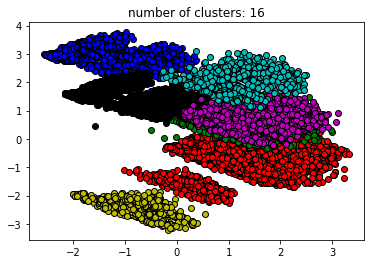

In [57]:
import numpy as np 
from sklearn.cluster import DBSCAN 
from sklearn import metrics 
from sklearn.preprocessing import StandardScaler 


# Load data in X 
db = DBSCAN(eps=1, min_samples=100).fit(X) 
core_samples_mask = np.zeros_like(db.labels_, dtype=bool) 
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_ 

# Number of clusters in labels, ignoring noise if present. 
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0) 

print(labels) 

# Plot result 
import matplotlib.pyplot as plt 

# Black removed and is used for noise instead. 
unique_labels = set(labels) 
colors = ['r', 'g', 'b', 'k', 'y', 'm', 'c'] 
print(colors) 
for k, col in zip(unique_labels, colors): 
	if k == -1: 
		# Black used for noise. 
		col = 'k'

	class_member_mask = (labels == k) 

	xy = X[class_member_mask & core_samples_mask] 
	plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=col, 
									markeredgecolor='k', 
									markersize=6) 

	xy = X[class_member_mask & ~core_samples_mask] 
	plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=col, 
									markeredgecolor='k', 
									markersize=6) 

plt.title('number of clusters: %d' %n_clusters_) 
plt.show() 


DBSCAN with the params formed 16 clusters. We have visualized 7 of them here.

In [58]:
set(labels)

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}

## Gaussian Mixture

In [104]:
X = finaldf.drop(['Response'],axis=1)
X

,pc1,pc2,pc3,pc4,pc5,pc6,pca7,pca8
0,0.843290,-0.806579,0.770280,-1.285167,0.290294,0.706969,-0.959045,0.020695
1,0.871004,-0.745706,0.774339,-1.189650,0.021580,1.056287,-0.778992,-0.234500
2,0.861658,-0.838309,0.758949,-1.333799,0.339801,0.715176,-1.046876,0.051161
3,0.945737,-0.842083,0.728772,-1.214330,0.622454,-0.382211,-0.792709,-0.087583
4,1.016109,-0.894034,0.696505,-1.095785,0.738047,-0.710527,-0.743064,0.004570
...,...,...,...,...,...,...,...,...
93415,1.257862,-0.511623,0.829209,-0.828612,-0.171527,0.380587,-0.076481,0.461921
93416,1.363336,1.083133,-1.711153,0.202537,-0.467127,-0.730081,1.100985,-0.145592
93417,1.452156,0.954118,-1.773191,0.286217,-0.639936,0.048712,0.894373,-0.105819
93418,1.979277,0.716233,-1.930235,0.732459,-0.511086,-0.271404,0.936267,0.522045


In [102]:
gmm = GaussianMixture(n_components = 6) 
gmm.fit(X)

GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
                means_init=None, n_components=6, n_init=1, precisions_init=None,
                random_state=None, reg_covar=1e-06, tol=0.001, verbose=0,
                verbose_interval=10, warm_start=False, weights_init=None)

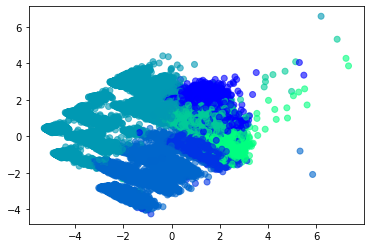

In [100]:

# Visualizing the clustering 
plt.scatter(X['pc1'], X['pc2'],
           c = GaussianMixture(n_components = 6).fit_predict(X), cmap =plt.cm.winter, alpha = 0.6) 
plt.show() 

We go for 6 gaussian components and plot this graph of clustering. And down we can see iterations and log liklihood for convergence.

In [103]:
# print the converged log-likelihood value 
print(gmm.lower_bound_) 
  
# print the number of iterations needed 
# for the log-likelihood value to converge 
print(gmm.n_iter_)

0.674950440272706
5


# Regression

By the process of classification we have found out the best model for our project. We also were intrested to visualize how the regression works for predicting vintage variable on our dataset. Hence we have taken a sample of data in a particular range and perfored regression techniques on them.

## Simple Linear Regression

In [21]:
from sklearn.preprocessing import StandardScaler

df = df[((df['Annual_Premium'] > 20000) & (df['Annual_Premium'] < 70000))]
df = df.sample(500)
y = df['Vintage']
# create a scaler object
scaler = StandardScaler()
# fit and transform the data
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)


In [22]:
df.head()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,G_0,G_1,VA_1-2 Year,VA_< 1 Year,VA_> 2 Years,VD_0,VD_1,Response
0,-0.160053,0.0,0.979817,-0.044766,-0.930911,1.079190,-1.696050,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
1,-1.057397,0.0,-0.404581,-0.044766,-1.511392,1.079190,-0.668771,-0.782881,0.782881,-1.750726,2.458100,-0.340693,0.135388,-0.135388,0.0
2,1.879363,0.0,-0.371009,-0.044766,-0.544093,2.032684,0.116796,1.277333,-1.277333,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
3,-0.078477,0.0,0.979817,-0.044766,0.908628,0.316636,-1.345567,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
4,0.574137,0.0,-0.404581,-0.044766,-0.538216,0.316636,-0.378716,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0


In [23]:
dfi = df


In [24]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X = dfi.Annual_Premium.values.reshape(-1,1)


X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

x_range = np.linspace(X.min(), X.max(), 100)
y_range = model.predict(x_range.reshape(-1, 1))


fig = go.Figure([
    go.Scatter(x=X_train.squeeze(), y=y_train, name='train', mode='markers'),
    go.Scatter(x=X_test.squeeze(), y=y_test, name='test', mode='markers'),
    go.Scatter(x=x_range, y=y_range, name='prediction')
])
fig.show()

In [25]:
# calculate R^2 value, MAE, MSE, RMSE

y_pred = model.predict(X_test)

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value -0.004212113737272594


mean_absolute_error : 73.58353514674478


mean_squared_error :  7264.181217686675


root_mean_squared_error :  85.23016612495059


In [26]:
X = df.drop('Vintage',axis=1)

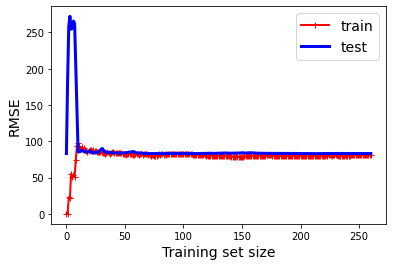

In [27]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def plot_learning_curves(model, X, y):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=10)
    train_errors, val_errors = [], []
    for m in range(1, len(X_train)):
        model.fit(X_train[:m], y_train[:m])
        y_train_predict = model.predict(X_train[:m])
        y_val_predict = model.predict(X_val)
        train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
        val_errors.append(mean_squared_error(y_val, y_val_predict))

    plt.plot(np.sqrt(train_errors), "r-+", linewidth=2, label="train")
    plt.plot(np.sqrt(val_errors), "b-", linewidth=3, label="test")
    plt.legend(loc="upper right", fontsize=14)   
    plt.xlabel("Training set size", fontsize=14) 
    plt.ylabel("RMSE", fontsize=14)         

    
model = LinearRegression()
plot_learning_curves(model, X_train, y_train)                          

This is a diagram that is used to visualize how our training and test data generalizes over a visiting a particular set of data. As we can see here our model after an instance the model performs fine. This diagram is also used to check the rmse with respect to our model and tell us if our model is overfitting or underfitting in nature.

## Multiple Linear Regression

In [28]:
X = df.drop(['Vintage'],axis=1)


In [29]:
X.head()

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,G_0,G_1,VA_1-2 Year,VA_< 1 Year,VA_> 2 Years,VD_0,VD_1,Response
0,-0.160053,0.0,0.979817,-0.044766,-0.930911,1.079190,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
1,-1.057397,0.0,-0.404581,-0.044766,-1.511392,1.079190,-0.782881,0.782881,-1.750726,2.458100,-0.340693,0.135388,-0.135388,0.0
2,1.879363,0.0,-0.371009,-0.044766,-0.544093,2.032684,1.277333,-1.277333,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
3,-0.078477,0.0,0.979817,-0.044766,0.908628,0.316636,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0
4,0.574137,0.0,-0.404581,-0.044766,-0.538216,0.316636,-0.782881,0.782881,0.571192,-0.406818,-0.340693,0.135388,-0.135388,0.0


In [30]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3,random_state=42)


In [31]:
X_train.shape

(350, 14)

In [32]:
# importing the LinearRegression class from linear_model submodule of scikit learn
from sklearn.linear_model import LinearRegression
# instantiating
multiple_lr = LinearRegression()
# Fitting the multiple_lr object to the data , this time using the whole feature matrix X
multiple_lr = LinearRegression().fit(X_train,y_train)
y_pred = multiple_lr.predict(X_test)


In [33]:
# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value -0.03297469705535372


mean_absolute_error : 75.45656059540674


mean_squared_error :  7556.21179126936


root_mean_squared_error :  86.92647347770045


In [34]:
# Saving an array containing all the ten coefficients
#multiple_lr_coeffs = multiple_lr.coef_[0]
multiple_lr_coeffs = multiple_lr.coef_
multiple_lr_coeffs

array([ 2.95368339e+00, -2.22044605e-15,  3.11539742e+00, -5.98621028e+00,
        3.08781900e+00, -1.63470461e+00, -3.12517079e-01,  3.12517079e-01,
       -3.86326361e+00,  2.73512264e+00,  2.32303120e+00,  1.90697001e+00,
       -1.90697001e+00,  0.00000000e+00])

In [35]:
# fetching feature names from the dataframe df
feature_names = df.drop([ 'Vintage'],axis=1).columns
feature_names

Index(['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'G_0', 'G_1', 'VA_1-2 Year',
       'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1', 'Response'],
      dtype='object')

In [36]:
multiple_lr_coeffs = multiple_lr_coeffs.reshape(14,1)


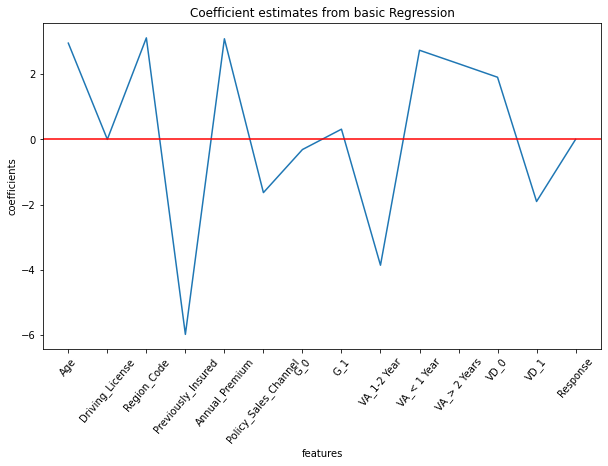

In [37]:
plt.figure(figsize=(10,6))
plt.plot(range(len(feature_names)),multiple_lr_coeffs)
plt.axhline(0, color='r', linestyle='solid')
plt.xticks(range(len(feature_names)),feature_names,rotation=50)
plt.title("Coefficient estimates from basic Regression")
plt.ylabel("coefficients")
plt.xlabel("features")
plt.show()

We go for both Ridge as well as Lasso regularization and we can find that Lasso is better and giving lesser RMSE and hence we move forward by taking Lasso's coeffecient as its better.

In [38]:
# importing the Ridge class from linear_model submodule of scikit learn
from sklearn.linear_model import Ridge
# importing the GridSearchCV class from model_selection submodule of scikit learn
from sklearn.model_selection import GridSearchCV
# creating a dictionary containing potential values of alpha
alpha_values = {'alpha':[0.001, 0.01,0.02,0.03,0.04, 0.05, 0.06, 0.08, 1, 2, 3, 5, 8, 10, 20, 50, 100]}
# Passing in a Ridge estimator, potential alpha values, scoring method and cross validation parameters to the GridSearchCV
ridge= GridSearchCV(Ridge(), alpha_values, scoring='neg_mean_squared_error', cv=10 )
# Fitting the model to the data and extracting best value of alpha
print('The best value of alpha is:',ridge.fit(X_train,y_train).best_params_)
# Printing the average neg_mean_squared_error of a 10-fold cross validation
print('The best score for the best Ridge estimator is:',ridge.fit(X_train,y_train).best_score_)

The best value of alpha is: {'alpha': 100}
The best score for the best Ridge estimator is: -6763.782705052259


In [39]:
# Creating an object containing the best ridge regression model
best_ridge_model= Ridge(alpha=100)
# Extracting the coefficient estimates for all ten features
best_ridge_coeffs = best_ridge_model.fit(X_train,y_train).coef_
# plotting the coefficient estimates for all ten features
y_pred = ridge.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value -0.030548961876978087


mean_absolute_error : 75.57760876707606


mean_squared_error :  7538.4675340193135


root_mean_squared_error :  86.82434873939057


In [40]:
# importing the Ridge class from linear_model submodule of scikit learn
from sklearn.linear_model import Lasso
# importing the GridSearchCV class from model_selection submodule of scikit learn
from sklearn.model_selection import GridSearchCV
# creating a dictionary containing potential values of alpha
alpha_values = {'alpha':[0.001, 0.01,0.02,0.03,0.04, 0.05, 0.06, 0.08, 1, 2, 3, 5, 8, 10, 20, 50, 100]}
# Passing in a Lasso estimator, potential alpha values, scoring method and cross validation parameters to the GridSearchCV
ridge= GridSearchCV(Lasso(), alpha_values, scoring='neg_mean_squared_error', cv=10 )
# Fitting the model to the data and extracting best value of alpha
print('The best value of alpha is:',ridge.fit(X_train,y_train).best_params_)
# Printing the average neg_mean_squared_error of a 10-fold cross validation
print('The best score for the best Ridge estimator is:',ridge.fit(X_train,y_train).best_score_)

The best value of alpha is: {'alpha': 10}
The best score for the best Ridge estimator is: -6593.477724363821


In [41]:
# Creating an object containing the best ridge regression model
best_ridge_model= Ridge(alpha=10)
# Extracting the coefficient estimates for all ten features
best_ridge_coeffs = best_ridge_model.fit(X_train,y_train).coef_
# plotting the coefficient estimates for all ten features
y_pred = ridge.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

R-Square Value -0.04698512658974363


mean_absolute_error : 76.88148571428572


mean_squared_error :  7658.698108843537


root_mean_squared_error :  87.51398807529878


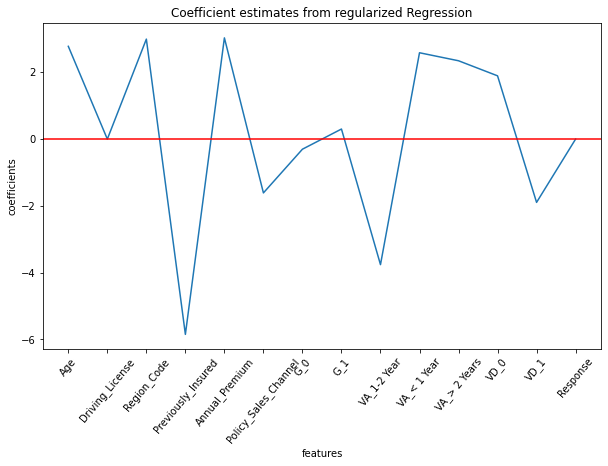

In [42]:
plt.figure(figsize=(10,6))
best_ridge_coeffs = best_ridge_coeffs.reshape(14,1)
plt.plot(range(len(feature_names)),best_ridge_coeffs)
plt.axhline(0, color='r', linestyle='solid')
plt.xticks(range(len(feature_names)),feature_names,rotation=50)
plt.title("Coefficient estimates from regularized Regression")
plt.ylabel("coefficients")
plt.xlabel("features")
plt.show()

In [43]:
multiple_lr_coeffs.flatten()

array([ 2.95368339e+00, -2.22044605e-15,  3.11539742e+00, -5.98621028e+00,
        3.08781900e+00, -1.63470461e+00, -3.12517079e-01,  3.12517079e-01,
       -3.86326361e+00,  2.73512264e+00,  2.32303120e+00,  1.90697001e+00,
       -1.90697001e+00,  0.00000000e+00])

In [44]:
best_ridge_coeffs.flatten()

array([ 2.77919341,  0.        ,  2.99518437, -5.84886005,  3.03241203,
       -1.61121027, -0.3019627 ,  0.3019627 , -3.75982909,  2.58675038,
        2.34675628,  1.89552728, -1.89552728,  0.        ])

In [45]:

dta = {'without_regularization': [2.95368339e+00, -2.22044605e-15,  3.11539742e+00, -5.98621028e+00,
        3.08781900e+00, -1.63470461e+00, -3.12517079e-01,  3.12517079e-01,
       -3.86326361e+00,  2.73512264e+00,  2.32303120e+00,  1.90697001e+00,
       -1.90697001e+00,  0.00000000e+00 ],
        'with_regularization': [2.77919341,  0.        ,  2.99518437, -5.84886005,  3.03241203,
       -1.61121027, -0.3019627 ,  0.3019627 , -3.75982909,  2.58675038,
        2.34675628,  1.89552728, -1.89552728,  0.     ]
        }
comparing_models = pd.DataFrame(dta, columns = ['without_regularization','with_regularization'], index = ['Age', 'Driving_License', 'Region_Code', 'Previously_Insured',
       'Annual_Premium', 'Policy_Sales_Channel', 'G_0', 'G_1', 'VA_1-2 Year',
       'VA_< 1 Year', 'VA_> 2 Years', 'VD_0', 'VD_1', 'Response'])
# Highlighting coefficient estimates with value '0'

comparing_models

,without_regularization,with_regularization
Age,2.953683e+00,2.779193
Driving_License,-2.220446e-15,0.000000
Region_Code,3.115397e+00,2.995184
Previously_Insured,-5.986210e+00,-5.848860
Annual_Premium,3.087819e+00,3.032412
Policy_Sales_Channel,-1.634705e+00,-1.611210
G_0,-3.125171e-01,-0.301963
G_1,3.125171e-01,0.301963
VA_1-2 Year,-3.863264e+00,-3.759829
VA_< 1 Year,2.735123e+00,2.586750


Comparison of coeffecients with respect to both regularized and not regularized ones.

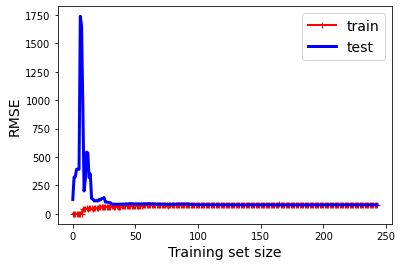

In [47]:
model = LinearRegression()
plot_learning_curves(model, X_train, y_train) 

In [113]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LassoCV

N_FOLD = 10

# Train model to predict life expectancy
model = LassoCV(cv=N_FOLD)
model.fit(X_test, y_test)
mean_alphas = model.mse_path_.mean(axis=1)

fig = go.Figure([
    go.Scatter(
        x=model.alphas_, y=model.mse_path_[:, i],
        name=f"Fold: {i+1}", opacity=.5, line=dict(dash='dash'),
        hovertemplate="alpha: %{x} <br>MSE: %{y}"
    )
    for i in range(N_FOLD)
])
fig.add_traces(go.Scatter(
    x=model.alphas_, y=mean_alphas,
    name='Mean', line=dict(color='black', width=4),
    hovertemplate="alpha: %{x} <br>MSE: %{y}",
))

fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0=model.alpha_, y0=0,
    x1=model.alpha_, y1=1,
    yref='paper'
)

fig.update_layout(
    xaxis_title='alpha',
    xaxis_type="log",
    yaxis_title="Mean Square Error (MSE)"
)
fig.show()


Visualizing how alpha varies across MSE across 10 folds.

## Polynomial Regression

In [48]:
Xr = dfi.Annual_Premium.values.reshape(-1,1)
yr = y

from sklearn.model_selection import train_test_split
Xr_train, Xr_test, yr_train, yr_test=train_test_split(Xr,yr,test_size=0.3)

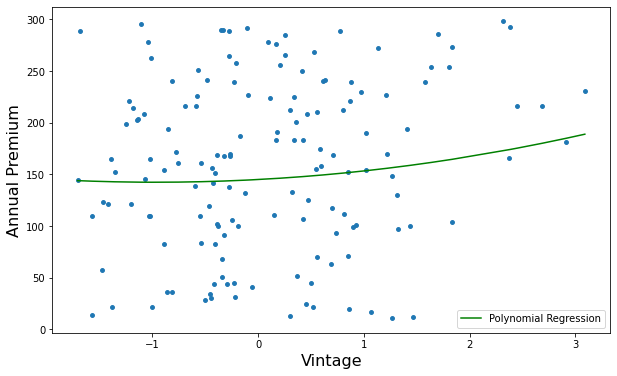

In [49]:
# importing libraries for polynomial transform
from sklearn.preprocessing import PolynomialFeatures
# for creating pipeline
from sklearn.pipeline import Pipeline
# creating pipeline and fitting it on data
Input=[('polynomial',PolynomialFeatures()),('modal',LinearRegression())]
pipe=Pipeline(Input)
pipe.fit(Xr_train.reshape(-1,1),yr_train)

poly_pred=pipe.predict(Xr_test)
poly_pred.reshape(-1,1)
#sorting predicted values with respect to predictor
sorted_zip = sorted(zip(Xr_test,poly_pred))
Xr_test, poly_pred = zip(*sorted_zip)
#plotting predictions
plt.figure(figsize=(10,6))
plt.scatter(Xr_test,yr_test,s=15)
plt.plot(Xr_test,poly_pred,color='g',label='Polynomial Regression')
plt.xlabel('Vintage',fontsize=16)
plt.ylabel('Annual Premium',fontsize=16)
plt.legend()
plt.show()

In [50]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

def PolynomialRegression(degree=2, **kwargs):
    return make_pipeline(PolynomialFeatures(degree),
                         LinearRegression(**kwargs))

In [51]:
# calculate R^2 value, MAE, MSE, RMSE
from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(yr_test,poly_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(yr_test, poly_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(yr_test, poly_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(yr_test, poly_pred)))

R-Square Value 0.007348090595368673


mean_absolute_error : 68.87419802799137


mean_squared_error :  6641.012274752577


root_mean_squared_error :  81.49240623979989


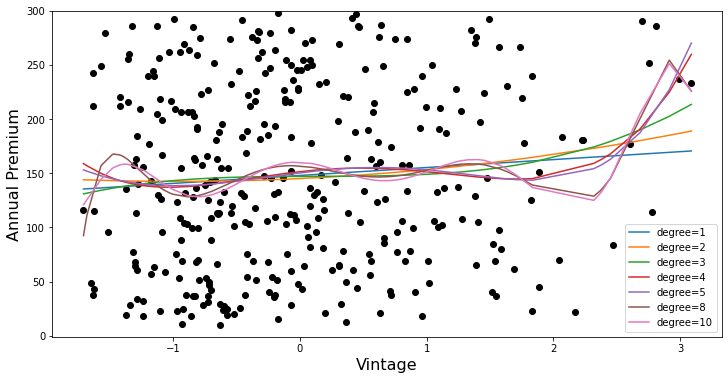

In [54]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.ylim([-1, 300])
plt.scatter(Xr_train.ravel(), yr_train, color='black')


for degree in [1, 2, 3, 4 , 5 ,8 ,10]:
    yr_test = PolynomialRegression(degree).fit(Xr_train, yr_train).predict(Xr_test)
    plt.plot(Xr_test, yr_test, label='degree={0}'.format(degree))
    plt.xlabel('Vintage',fontsize=16)
    plt.ylabel('Annual Premium',fontsize=16)

plt.legend(loc='best');

We can visualize how the polynomial regression is wit different degrees.

In [55]:
X = df.drop(['Vintage'],axis=1)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3)


In [56]:
# importing libraries for polynomial transform
from sklearn.preprocessing import PolynomialFeatures
# for creating pipeline
from sklearn.pipeline import Pipeline
# creating pipeline and fitting it on data
Input=[('polynomial',PolynomialFeatures()),('modal',LinearRegression())]
pipe=Pipeline(Input)
pipe.fit(X_train,y_train)


Pipeline(memory=None,
         steps=[('polynomial',
                 PolynomialFeatures(degree=2, include_bias=True,
                                    interaction_only=False, order='C')),
                ('modal',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)

In [57]:
# calculate R^2 value, MAE, MSE, RMSE
from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,poly_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, poly_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, poly_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, poly_pred)))

R-Square Value -0.011457911164945767


mean_absolute_error : 71.34473381315456


mean_squared_error :  6674.102824091332


root_mean_squared_error :  81.695182379938


## SVR

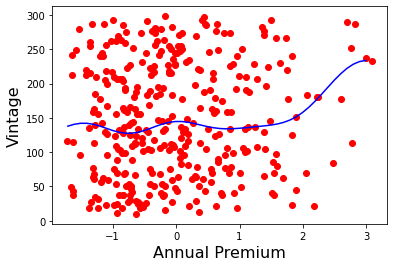

In [58]:
from sklearn.svm import SVR
regressor = SVR(degree=2, C=100, epsilon=.01)
regressor.fit(Xr_train, yr_train)
yr_pred = regressor.predict(Xr_test)
Xr_grid = np.arange(min(Xr_test), max(Xr_test), 0.1)
Xr_grid = Xr_grid.reshape((len(Xr_grid), 1))
plt.scatter(Xr_train, yr_train, color = 'red')
plt.plot(Xr_grid, regressor.predict(Xr_grid), color = 'blue')
plt.xlabel('Annual Premium',fontsize=16)
plt.ylabel('Vintage',fontsize=16)

plt.show()

In [59]:
# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(yr_test,yr_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(yr_test, yr_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(yr_test, yr_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(yr_test, yr_pred)))

R-Square Value -0.13410874480468737


mean_absolute_error : 12.655861631484875


mean_squared_error :  248.62389793940508


root_mean_squared_error :  15.767812084731512


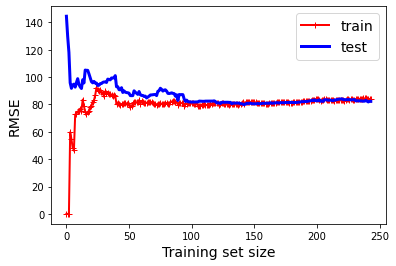

In [60]:
plot_learning_curves(regressor, Xr_train, yr_train)  

In [61]:
from sklearn.svm import SVR
regressor = SVR(degree=2, C=100, epsilon=.01)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)


In [62]:
# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


R-Square Value -0.07706042954225922


mean_absolute_error : 73.22456072939146


mean_squared_error :  7106.9808987363285


root_mean_squared_error :  84.3029115673731


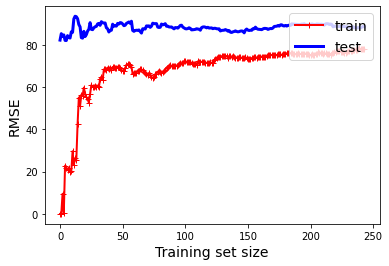

In [64]:
plot_learning_curves(regressor, X_train, y_train)  

In [65]:
from sklearn.svm import SVR
regressor = SVR(degree=3, C=100, epsilon=.01)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)


R-Square Value -0.07706042954225922


mean_absolute_error : 73.22456072939146


mean_squared_error :  7106.9808987363285


root_mean_squared_error :  84.3029115673731


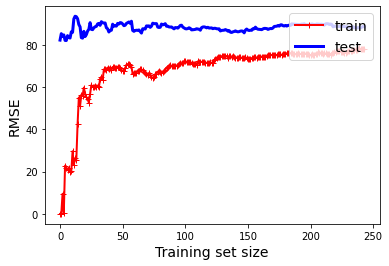

In [66]:
# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

plot_learning_curves(regressor, X_train, y_train)  

R-Square Value -0.005180426271340632


mean_absolute_error : 71.3028340657847


mean_squared_error :  6632.680853691846


root_mean_squared_error :  81.44127242186143


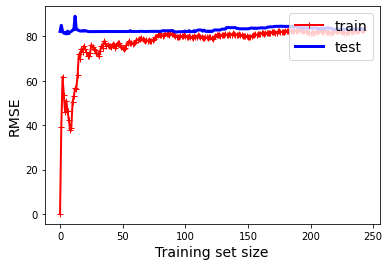

In [67]:
from sklearn.svm import SVR
regressor = SVR(kernel='poly')
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plot_learning_curves(regressor, X_train, y_train)  


plt.show()

R-Square Value -0.07043565945853736


mean_absolute_error : 73.30817011702246


mean_squared_error :  7063.267367766167


root_mean_squared_error :  84.0432470087048


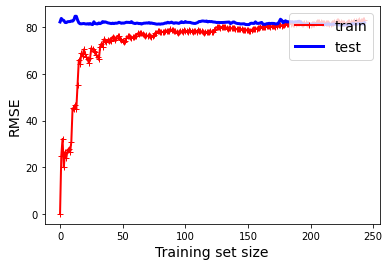

In [68]:
from sklearn.svm import SVR
regressor = SVR(kernel='linear')
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plot_learning_curves(regressor, X_train, y_train)  



R-Square Value -0.010713960942607015


mean_absolute_error : 71.55379447426527


mean_squared_error :  6669.193870169389


root_mean_squared_error :  81.66513252404228


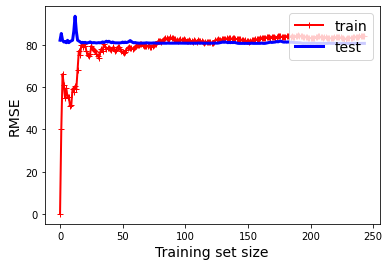

In [69]:
from sklearn.svm import SVR
regressor = SVR(kernel='rbf')
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plot_learning_curves(regressor, X_train, y_train)  


plt.show()

In [70]:
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import reciprocal, uniform

param_distributions = {"kernel": ("poly","linear","rbf"), "C": uniform(1, 10)}
rnd_search_cv = RandomizedSearchCV(SVR(), param_distributions, n_iter=100, verbose=2, cv=5, random_state=42)
rnd_search_cv.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] C=4.745401188473625, kernel=poly ................................
[CV] ................. C=4.745401188473625, kernel=poly, total=   0.0s
[CV] C=4.745401188473625, kernel=poly ................................
[CV] ................. C=4.745401188473625, kernel=poly, total=   0.0s
[CV] C=4.745401188473625, kernel=poly ................................
[CV] ................. C=4.745401188473625, kernel=poly, total=   0.0s
[CV] C=4.745401188473625, kernel=poly ................................
[CV] ................. C=4.745401188473625, kernel=poly, total=   0.0s
[CV] C=4.745401188473625, kernel=poly ................................
[CV] ................. C=4.745401188473625, kernel=poly, total=   0.0s
[CV] C=2.8343478986616377, kernel=poly ...............................
[CV] ................ C=2.8343478986616377, kernel=poly, total=   0.0s
[CV] C=2.8343478986616377, kernel=poly ...............................
[CV] .........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] ................. C=2.5599452033620267, kernel=rbf, total=   0.0s
[CV] C=5.592488919658671, kernel=poly ................................
[CV] ................. C=5.592488919658671, kernel=poly, total=   0.0s
[CV] C=5.592488919658671, kernel=poly ................................
[CV] ................. C=5.592488919658671, kernel=poly, total=   0.0s
[CV] C=5.592488919658671, kernel=poly ................................
[CV] ................. C=5.592488919658671, kernel=poly, total=   0.0s
[CV] C=5.592488919658671, kernel=poly ................................
[CV] ................. C=5.592488919658671, kernel=poly, total=   0.0s
[CV] C=5.592488919658671, kernel=poly ................................
[CV] ................. C=5.592488919658671, kernel=poly, total=   0.0s
[CV] C=7.011150117432088, kernel=rbf .................................
[CV] .................. C=7.011150117432088, kernel=rbf, total=   0.0s
[CV] C=7.011150117432088, kernel=rbf .................................
[CV] .

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    5.3s finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                                 epsilon=0.1, gamma='scale', kernel='rbf',
                                 max_iter=-1, shrinking=True, tol=0.001,
                                 verbose=False),
                   iid='deprecated', n_iter=100, n_jobs=None,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f34f0b09a58>,
                                        'kernel': ('poly', 'linear', 'rbf')},
                   pre_dispatch='2*n_jobs', random_state=42, refit=True,
                   return_train_score=False, scoring=None, verbose=2)

R-Square Value -0.010713960942607015


mean_absolute_error : 71.55379447426527


mean_squared_error :  6669.193870169389


root_mean_squared_error :  81.66513252404228


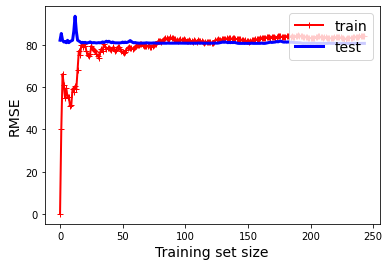

In [71]:
from sklearn.svm import SVR
regressor = SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                                 epsilon=0.1, gamma='scale', kernel='rbf',
                                 max_iter=-1, shrinking=True, tol=0.001,
                                 verbose=False)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plot_learning_curves(regressor, X_train, y_train)  



## Decesion Tree

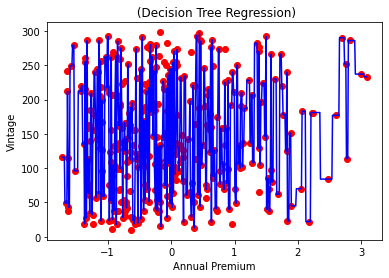

In [77]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor 

# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0) 

# fit the regressor with X and Y data 
regressor.fit(Xr_train, yr_train) 

# arange for creating a range of values 
# from min value of X to max value of X 
# with a difference of 0.01 between two 
# consecutive values 
X_grid = np.arange(min(Xr_train), max(Xr_train), 0.01) 

# reshape for reshaping the data into 
# a len(X_grid)*1 array, i.e. to make 
# a column out of the X_grid values 
X_grid = X_grid.reshape((len(X_grid), 1)) 

# scatter plot for original data 
plt.scatter(Xr_train, yr_train, color = 'red') 

# plot predicted data 
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue') 

# specify title 
plt.title(' (Decision Tree Regression)') 

# specify X axis label 
plt.xlabel('Annual Premium') 

# specify Y axis label 
plt.ylabel('Vintage') 

# show the plot 
plt.show() 


We can see here that Decesion tree has overfitted the data. So we must reduce the max depth.

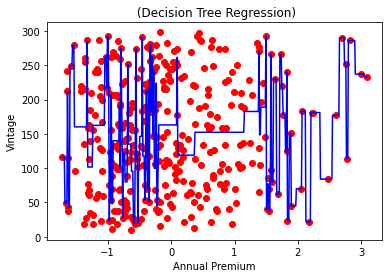

In [80]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor 

# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0,max_depth=10) 

# fit the regressor with X and Y data 
regressor.fit(Xr_train, yr_train) 

# arange for creating a range of values 
# from min value of X to max value of X 
# with a difference of 0.01 between two 
# consecutive values 
X_grid = np.arange(min(Xr_train), max(Xr_train), 0.01) 

# reshape for reshaping the data into 
# a len(X_grid)*1 array, i.e. to make 
# a column out of the X_grid values 
X_grid = X_grid.reshape((len(X_grid), 1)) 

# scatter plot for original data 
plt.scatter(Xr_train, yr_train, color = 'red') 

# plot predicted data 
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue') 

# specify title 
plt.title(' (Decision Tree Regression)') 

# specify X axis label 
plt.xlabel('Annual Premium') 

# specify Y axis label 
plt.ylabel('Vintage') 

# show the plot 
plt.show() 


Visualizing when the max depth is reduced to 10

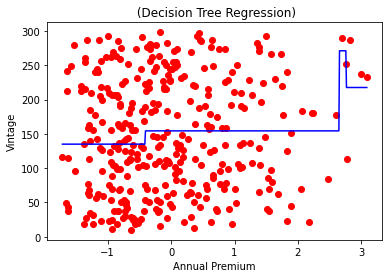

In [94]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor 

# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0,max_depth=2) 

# fit the regressor with X and Y data 
regressor.fit(Xr_train, yr_train) 

# arange for creating a range of values 
# from min value of X to max value of X 
# with a difference of 0.01 between two 
# consecutive values 
X_grid = np.arange(min(Xr_train), max(Xr_train), 0.01) 

# reshape for reshaping the data into 
# a len(X_grid)*1 array, i.e. to make 
# a column out of the X_grid values 
X_grid = X_grid.reshape((len(X_grid), 1)) 

# scatter plot for original data 
plt.scatter(Xr_train, yr_train, color = 'red') 

# plot predicted data 
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue') 

# specify title 
plt.title(' (Decision Tree Regression)') 

# specify X axis label 
plt.xlabel('Annual Premium') 

# specify Y axis label 
plt.ylabel('Vintage') 

# show the plot 
plt.show() 


Depth reduced to 2.

R-Square Value -0.13410874480468737


mean_absolute_error : 12.655861631484875


mean_squared_error :  248.62389793940508


root_mean_squared_error :  15.767812084731512


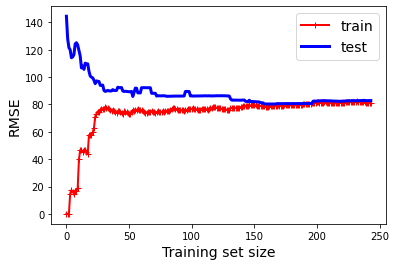

In [93]:
from sklearn.tree import DecisionTreeRegressor  
  
# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0, max_depth=2)  

regressor.fit(Xr_train, yr_train)
y_pred = regressor.predict(Xr_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(yr_test,yr_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(yr_test, yr_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(yr_test, yr_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(yr_test, yr_pred)))
plot_learning_curves(regressor, Xr_train, yr_train)  



R-Square Value -0.10478730732254182


mean_absolute_error : 74.70600108388787


mean_squared_error :  7289.9366413865455


root_mean_squared_error :  85.38112579128098


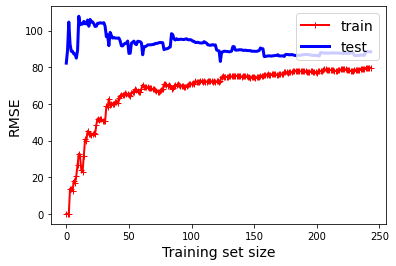

In [95]:
from sklearn.tree import DecisionTreeRegressor  
  
# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0, max_depth=2)  

regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

# calculate R^2 value, MAE, MSE, RMSE

from sklearn.metrics import r2_score
from sklearn import metrics
print("R-Square Value",r2_score(y_test,y_pred))
print("\n")
print ("mean_absolute_error :",metrics.mean_absolute_error(y_test, y_pred))
print("\n")
print ("mean_squared_error : ",metrics.mean_squared_error(y_test, y_pred))
print("\n")
print ("root_mean_squared_error : ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
plot_learning_curves(regressor, X_train, y_train)  



In [115]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

N_FOLD = 10


model = DecisionTreeRegressor()
param_grid = {
    'criterion': ['mse', 'friedman_mse', 'mae'],
    'max_depth': range(2, 10)
}
grid = GridSearchCV(model, param_grid, cv=N_FOLD)
grid.fit(X_train, y_train)
grid_df = pd.DataFrame(grid.cv_results_)

# Convert the wide format of the grid into the long format
# accepted by plotly.express
melted = (
    grid_df
    .rename(columns=lambda col: col.replace('param_', ''))
    .melt(
        value_vars=[f'split{i}_test_score' for i in range(N_FOLD)],
        id_vars=['mean_test_score', 'mean_fit_time', 'criterion', 'max_depth'],
        var_name="cv_split",
        value_name="r_squared"
    )
)

# Format the variable names for simplicity
melted['cv_split'] = (
    melted['cv_split']
    .str.replace('_test_score', '')
    .str.replace('split', '')
)

# Single function call to plot each figure
fig_hmap = px.density_heatmap(
    melted, x="max_depth", y='criterion',
    histfunc="sum", z="r_squared",
    title='Grid search results on individual fold',
    hover_data=['mean_fit_time'],
    facet_col="cv_split", facet_col_wrap=3,
    labels={'mean_test_score': "mean_r_squared"}
)

fig_box = px.box(
    melted, x='max_depth', y='r_squared',
    title='Grid search results ',
    hover_data=['mean_fit_time'],
    points='all',
    color="criterion",
    hover_name='cv_split',
    labels={'mean_test_score': "mean_r_squared"}
)

# Display
fig_hmap.show()
fig_box.show()

Here we can see that how the R2 varies across different depth of our Decesion Tree . With this we can also see we doing it for different cross validations and checking how error varies across depths. We can see the initial depth of 2 is better and as depth increases the model tends to overfit more.